# <a id='toc1_'></a>[Données scientifique du suivi de la Grotte de la Petite Balme](#toc0_)





## <a id='toc1_1_'></a>[Import des librairies](#toc0_)

Import des librairies python permettant de faire fonctionner les scripts

In [1]:
# Imports
import os
import json
import numpy as np
from numpy import polyfit, log, exp

import csv
import time
from datetime import datetime, timedelta, date
import requests
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
from scipy.stats import norm
import math
from scipy import signal
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from scipy.interpolate import interp1d
import trimesh

warnings.filterwarnings('ignore')


## <a id='toc1_2_'></a>[Définitions des fonctions](#toc0_)

In [2]:

#fonction pour la lecture des données issus de capteurs Reefnet

def reefnet_function(path):
  colnames=['Index', 'Number', 'Years', 'Month','Day','Hours','Min','Second','record time(s)','pressure(mbar)','T(K)','Tdec(K)']
  data=pd.read_csv(path,names=colnames,skiprows=0)
  data['date']=pd.to_datetime(data['Years'].astype(str)+'-'+data['Month'].astype(str)+'-'+data['Day'].astype(str)+' '+data['Hours'].astype(str)+':'+data['Min'].astype(str)+':'+data['Second'].astype(str), format='%Y-%m-%d %H:%M:%S')
  data=data.drop(columns=[ 'Years', 'Month','Day','Hours','Min','Second'])
  data['datetime']=data['date']+data['record time(s)'].astype('timedelta64[s]')
  data=data.drop(columns=['date','record time(s)'])
  data=data.set_index('datetime')
  data['T(K)']=data['T(K)']+data['Tdec(K)']/100
  data=data.drop(columns=['Tdec(K)'])
  return data

# fonction pour la création d'histogramme coloré
def hist_colored_by_values(data, values, nb_bins=30, title="Histogramme", xlabel="Valeur"):
    """
    data : série ou array des valeurs à histogrammer (intercept ou slope)
    values : série ou array des values_lin correspondants
    """
    # Histogramme : counts et bin_edges
    counts, bin_edges = np.histogram(data, bins=nb_bins)
    
    # Pour chaque point, déterminer son bin
    bin_indices = np.digitize(data, bin_edges) - 1
    
    # Moyenne de values dans chaque bin
    bin_values_mean = np.zeros(nb_bins)
    for i in range(nb_bins):
        mask = bin_indices == i
        if np.any(mask):
            bin_values_mean[i] = np.mean(values[mask])
        else:
            bin_values_mean[i] = np.nan
    
    # Normalisation pour colormap
    cmap = plt.cm.viridis
    norm = plt.Normalize(np.nanmin(bin_values_mean), np.nanmax(bin_values_mean))
    colors = cmap(norm(bin_values_mean))
    
    # Tracé de chaque bin individuellement
    fig, ax = plt.subplots(figsize=(10,6))
    for i in range(nb_bins):
        plt.bar(bin_edges[i], counts[i], width=bin_edges[1]-bin_edges[0],
                color=colors[i], align='edge', edgecolor='k')
    
    # Barre de couleur
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)   # <-- préciser ax ici
    cbar.set_label("R2_lin moyen")
    
    plt.xlabel(xlabel)
    plt.ylabel("Nombre de points")
    plt.title(title)
    plt.show()

# Fonction pour calculer pente, intercept et R² (régression linéaire h = slope*t + intercept)
def fit_slope(sdf,variable):
    """
    sdf : sous-DataFrame pour un épisode (index datetime)
    retourne : slope (m/h), intercept (m), r2
    """
    if sdf.empty:
        return np.nan, np.nan, np.nan

    t = (sdf.index - sdf.index[0]).total_seconds() / 3600.0  # heures
    h = sdf[variable].values

    if len(h) < 2:
        return np.nan, np.nan, np.nan

    slope, intercept = np.polyfit(t, h, 1)
    h_pred = slope * t + intercept
    ss_res = np.sum((h - h_pred) ** 2)
    ss_tot = np.sum((h - np.mean(h)) ** 2)
    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

    return slope, intercept, r2


# Fonction pour ajuster tau exponentiel sur une décharge
def fit_tau(sdf):
    """
    sdf = sous-DataFrame correspondant à une phase de décharge
    Retourne tau (h), R² et h_inf estimé
    """
    t = (sdf.index - sdf.index[0]).total_seconds()/3600  # temps en h
    h = sdf["Hauteur_eau_siphon"].values

    # Niveau résiduel estimé : médiane des 10% derniers points
    k = max(1, int(0.1*len(h)))
    h_inf = np.median(h[-k:])

    # Vérifier que (h - h_inf) reste > 0
    if np.min(h - h_inf) <= 0:
        h_inf = np.min(h) - 1e-6

    # Linéarisation ln(h - h_inf) = ln(h0-h_inf) - t/τ
    y = log(h - h_inf)
    mask = np.isfinite(y)
    if mask.sum() < 3:
        return np.nan, np.nan, h_inf

    slope, intercept = polyfit(t[mask], y[mask], 1)
    tau = -1/slope if slope < 0 else np.nan

    # Qualité d'ajustement R² sur la hauteur
    h_pred = exp(intercept + slope*t) + h_inf
    ss_res = np.sum((h - h_pred)**2)
    ss_tot = np.sum((h - np.mean(h))**2)
    r2 = 1 - ss_res/ss_tot if ss_tot>0 else np.nan

    return tau, r2, h_inf



def plot_fluo_turb(data, fluo_col='channel1', turb_col='channel2', 
                   fluo_color='b', turb_color='r', 
                   title='Fluorescence et Turbidité'):
    """
    Trace la fluorescence et la turbidité sur deux axes Y jumeaux.

    Paramètres
    ----------
    data : pd.DataFrame
        DataFrame avec un index de type datetime.
    fluo_col : str
        Nom de la colonne correspondant à la fluorescence.
    turb_col : str
        Nom de la colonne correspondant à la turbidité.
    fluo_color : str
        Couleur du tracé de la fluorescence.
    turb_color : str
        Couleur du tracé de la turbidité.
    title : str
        Titre de la figure.
    """

    fig, ax1 = plt.subplots(figsize=(10,5))

    # Axe pour la fluorescence
    ax1.plot(data.index, data[fluo_col].rolling(1).mean(), color=fluo_color, label='Fluorescence')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Conc Fluo (ppb)', color=fluo_color)
    ax1.tick_params(axis='y', labelcolor=fluo_color)

    # Axe jumeau pour la turbidité
    ax2 = ax1.twinx()
    ax2.plot(data.index, data[turb_col].rolling(1).mean(), color=turb_color, label='Turbidité')
    ax2.set_ylabel('Turbidité (NTU)', color=turb_color)
    ax2.tick_params(axis='y', labelcolor=turb_color)

    # Légende combinée
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    plt.title(title)
    plt.tight_layout()
    plt.show()



## <a id='toc1_3_'></a>[Définitions des chemins d'accès](#toc0_)

In [3]:
# Chemins des fichiers

PATH=r'.'

#METEO
PATH_CLIMAT1=PATH+"/Meteo/Quotidienne/Meteo_Tignes_2021_Quotidienne.csv"
PATH_CLIMAT2=PATH+"/Meteo/Quotidienne/Meteo_Tignes_2022_Quotidienne.csv"
PATH_CLIMAT3=PATH+"/Meteo/Quotidienne/Meteo_Tignes_2023_Quotidienne.csv"
PATH_CLIMAT4=PATH+"/Meteo/Quotidienne/Meteo_Tignes_2024_Quotidienne.csv"
PATH_CLIMAT5=PATH+"/Meteo/Quotidienne/Meteo_Tignes_2025_Quotidienne.csv"

PATH_CLIMAT1_h=PATH+"/Meteo/Horaire/Meteo_Tignes_2021_Horaire.csv"
PATH_CLIMAT2_h=PATH+"/Meteo/Horaire/Meteo_Tignes_2022_Horaire.csv"
PATH_CLIMAT3_h=PATH+"/Meteo/Horaire/Meteo_Tignes_2023_Horaire.csv"
PATH_CLIMAT4_h=PATH+"/Meteo/Horaire/Meteo_Tignes_2024_Horaire.csv"
PATH_CLIMAT5_h=PATH+"/Meteo/Horaire/Meteo_Tignes_2025_Horaire.csv"

#DEBITS
PATH_DEBIT1 = PATH+"/Debits/W002000102_Q.csv"

#TEMP CAVE
## bas du puits d'entée
TEMP_SITE_MT1 =PATH+"/Temperature_Air/Sonde4_T/LOG32T_21042410_2021-10-05T113937_SITE_4.csv" 
TEMP_SITE_MT1_a =PATH+"/Temperature_Air/Temperature_HOBO_2024-2025/Puits-entree.csv" #bas du puits d'entée

## jonction branche sud
# TEMP_SITE_MT2 = PATH+"/Temperature_Air/Sonde1_TH/LOG32TH_21040929_2021-10-05T121313_SITE_1TH.csv" 

## haut P50
# TEMP_SITE_MT3 =PATH+"/Temperature_Air/Sonde3_T/LOG32T_21062083_2021-10-05T140519_SITE_3.csv" 
# TEMP_SITE_MT3_a = PATH+"/Temperature_Air/21745243/21745243.csv" 
TEMP_SITE_MT3_b = PATH+"/Temperature_Air/Temperature_HOBO_2024-2025/Haut_P50.csv"

##bas P50
TEMP_SITE_MT4 =PATH+"/Temperature_Air/Temperature_HOBO_2024-2025/Bas_P50.csv" 

# Salle sortie étroiture
TEMP_SITE_6 = PATH+"/Temperature_Air/21745242/21745242_0.csv" 
TEMP_SITE_6b = PATH+"/Temperature_Air/21745240.csv"

#Pression 
##Reefnet
path_reefnet_ref = PATH+"/Mesure_hydro/Reefnet/Grotte/17348 ref.csv"
path_reefnet_siphon =PATH+"/Mesure_hydro/Reefnet/Grotte/17343 eau.csv"
### Hauteur d'eau rivière
path_reefnet_retor = PATH+"/Mesure_hydro/Reefnet/17072 RETOR.csv"
path_reefnet_caffo1 = PATH+"/Mesure_hydro/Reefnet/17075 CAFFO1.csv"
path_reefnet_caffo2 = PATH+"/Mesure_hydro/Reefnet/17079 CAFFO3.csv"

#Mesh du puits
# mesh = trimesh.load(r"C:\Users\burru\Documents\Styx 4D\2025-Bertholene\K1\Volume\Mesh_all.obj")
# mesh1 = trimesh.load(r"C:\Users\burru\Documents\Styx 4D\2025-Bertholene\K1\Volume\Entree.obj")
# mesh2 = trimesh.load(r"C:\Users\burru\Documents\Styx 4D\2025-Bertholene\K1\Volume\Autre.obj")

mesh = trimesh.load("Volume_topo/Mesh_puits.obj")

#Tracage
## Gouille de Salin
GS_1=PATH+"/Fluorimetre/Gouille_de_Salin/03092025_1100/data_tracage_fin0309_1100.mv"
GS_2=PATH+"/Fluorimetre/Gouille_de_Salin/11102025_1530/Fluo_111025_1530.mv"
GS_3=PATH+"/Fluorimetre/Gouille_de_Salin/08112025/08112025.mv"


## Caffo
Caffo_path=PATH+"/Fluorimetre/File_1_Fluorimetre-131_12-10-2025_RawMeasures_Caffo.csv"

## Retord
Retord_path=PATH+"/Fluorimetre/File_1_Fluorimetre-135_12-10-2025_RawMeasures_Retord.csv"


## <a id='toc1_4_'></a>[Chargement des données](#toc0_)



### <a id='toc1_4_1_'></a>[Données Météo-France à la station de Tignes](#toc0_)

In [4]:
#Données climats quotidienne

data_climat1=pd.read_csv(PATH_CLIMAT1,delimiter=";", decimal=",")
data_climat1['DATE']=pd.to_datetime(data_climat1['DATE'], format='%Y%m%d', dayfirst=True)
data_climat1.set_index('DATE', inplace=True)

data_climat2=pd.read_csv(PATH_CLIMAT2,delimiter=";", decimal=",")
data_climat2['DATE']=pd.to_datetime(data_climat2['DATE'], format='%Y%m%d', dayfirst=True)
data_climat2.set_index('DATE', inplace=True)

data_climat3=pd.read_csv(PATH_CLIMAT3,delimiter=";", decimal=",")
data_climat3['DATE']=pd.to_datetime(data_climat3['DATE'], format='%Y%m%d', dayfirst=True)
data_climat3.set_index('DATE', inplace=True)

data_climat4=pd.read_csv(PATH_CLIMAT4,delimiter=";", decimal=",")
data_climat4['DATE']=pd.to_datetime(data_climat4['DATE'], format='%Y%m%d', dayfirst=True)
data_climat4.set_index('DATE', inplace=True)

data_climat5=pd.read_csv(PATH_CLIMAT5,delimiter=";", decimal=",")
data_climat5['DATE']=pd.to_datetime(data_climat5['DATE'], format='%Y%m%d', dayfirst=True)
data_climat5.set_index('DATE', inplace=True)

DATA_CLIMAT=pd.concat([data_climat1,data_climat2,data_climat3,data_climat4,data_climat5])


In [5]:
#Données climats horaire

data_climat1=pd.read_csv(PATH_CLIMAT1_h,delimiter=";", decimal=",")

data_climat1['DATE']=pd.to_datetime(data_climat1['DATE'], format='%Y%m%d%H', dayfirst=True)
data_climat1.set_index('DATE', inplace=True)

data_climat2=pd.read_csv(PATH_CLIMAT2_h,delimiter=";", decimal=",")

data_climat2['DATE']=pd.to_datetime(data_climat2['DATE'], format='%Y%m%d%H', dayfirst=True)
data_climat2.set_index('DATE', inplace=True)

data_climat3=pd.read_csv(PATH_CLIMAT3_h,delimiter=";", decimal=",")

data_climat3['DATE']=pd.to_datetime(data_climat3['DATE'], format='%Y%m%d%H', dayfirst=True)
data_climat3.set_index('DATE', inplace=True)

data_climat4=pd.read_csv(PATH_CLIMAT4_h,delimiter=";", decimal=",")
data_climat4['DATE']=pd.to_datetime(data_climat4['DATE'], format='%Y%m%d%H', dayfirst=True)
data_climat4.set_index('DATE', inplace=True)

data_climat5=pd.read_csv(PATH_CLIMAT5_h,delimiter=";", decimal=",")
data_climat5['DATE']=pd.to_datetime(data_climat5['DATE'], format='%Y%m%d%H', dayfirst=True)
data_climat5.set_index('DATE', inplace=True)

DATA_CLIMAT_h=pd.concat([data_climat1,data_climat2,data_climat3,data_climat4,data_climat5])

### <a id='toc1_4_2_'></a>[Débits de l'Isère à Bourg Saint Maurice](#toc0_)

In [6]:
#DEBITS

data_debit=pd.read_csv(PATH_DEBIT1,delimiter=",")
data_debit['Date (TU)']=pd.to_datetime(data_debit['Date (TU)'], format="%Y-%m-%dT%H:%M:%S.%fZ", dayfirst=True)
data_debit.set_index('Date (TU)', inplace=True)


### <a id='toc1_4_3_'></a>[Données de températures acquises dans la grotte](#toc0_)

In [68]:
# DONNEES TEMPERATURE MT1
data_temp_1=pd.read_csv(TEMP_SITE_MT1,delimiter=';')
data_temp_1['Date']=pd.to_datetime(data_temp_1['Date'], format='%d/%m/%Y %H:%M', dayfirst=True).iloc[10:]

data_temp_1.set_index('Date', inplace=True)

data_temp_1_a=pd.read_csv(TEMP_SITE_MT1_a,delimiter=';').drop('#', axis=1).rename(columns={
    "Date et heure (CEST)": "Date",
    "Température , °C": "Temp"
})
data_temp_1_a['Date']=pd.to_datetime(data_temp_1_a['Date'], format='%m/%d/%Y %H:%M:%S', dayfirst=True).iloc[10:]

data_temp_1_a.set_index('Date', inplace=True)
data_temp_MT1=pd.concat([data_temp_1,data_temp_1_a])

# DONNEES TEMPERATURE MT2
# data_temp_MT2=pd.read_csv(TEMP_SITE_MT2,delimiter=';').rename(columns={
#     "DATETIME": "Date",
#     "TEMPCELS": "Temp"
# })
# data_temp_MT2['Date']=pd.to_datetime(data_temp_MT2['Date'], format='%d/%m/%Y %H:%M', dayfirst=True)

# data_temp_MT2.set_index('Date', inplace=True)

# DONNEES TEMPERATURE MT3

# data_temp_3=pd.read_csv(TEMP_SITE_MT3,delimiter=';').rename(columns={
#     "DATETIME": "Date",
#     "TEMPCELS": "Temp"
# })
# data_temp_3['Date']=pd.to_datetime(data_temp_3['Date'], format='%d/%m/%Y %H:%M', dayfirst=True).iloc[0:8020]

# data_temp_3.set_index('Date', inplace=True)

# data_temp_3_a=pd.read_csv(TEMP_SITE_MT3_a,delimiter=',',header=1).drop(['#','Coupleur attaché (LGR S/N: 21745243)','Hôte connecté (LGR S/N: 21745243)','Arrêté (LGR S/N: 21745243)','Fin de fichier (LGR S/N: 21745243)'], axis=1).rename(columns={
#     "Date Heure, GMT+02:00": "Date",
#     "Temp., °C (LGR S/N: 21745243, SEN S/N: 21745243, LBL: Petite Balme 3 ici>)": "Temp"
# })
# data_temp_3_a['Date']=pd.to_datetime(data_temp_3_a['Date'], format='%m/%d/%y %I:%M:%S %p', dayfirst=True).iloc[0:3440]

# data_temp_3_a.set_index('Date', inplace=True)

data_temp_3_b=pd.read_csv(TEMP_SITE_MT3_b,delimiter=';').drop('#', axis=1).rename(columns={
    "Date et heure (CEST)": "Date",
    "Température , °C": "Temp"
})
data_temp_3_b['Date']=pd.to_datetime(data_temp_3_b['Date'], format='%m/%d/%Y %H:%M:%S', dayfirst=True)

data_temp_3_b.set_index('Date', inplace=True)

# data_temp_MT3=pd.concat([data_temp_3,data_temp_3_a,data_temp_3_b])
data_temp_MT3=pd.concat([data_temp_3_b])

# DONNEES TEMPERATURE MT4
data_temp_MT4=pd.read_csv(TEMP_SITE_MT4,delimiter=';').drop('#', axis=1).rename(columns={
    "Date et heure (CEST)": "Date",
    "Température , °C": "Temp"
})
data_temp_MT4['Date']=pd.to_datetime(data_temp_MT4['Date'], format='%m/%d/%Y %H:%M:%S', dayfirst=True).iloc[0:8850]

data_temp_MT4.set_index('Date', inplace=True)

# DONNEES TEMPERATURE MT6
data_temp_MT6a=pd.read_csv(TEMP_SITE_6,delimiter=',',header=1).drop(['#','Fin de fichier (LGR S/N: 21745242)'], axis=1).rename(columns={
    "Date Heure, GMT+02:00": "Date",
    "Temp., °C (LGR S/N: 21745242, SEN S/N: 21745242, LBL: Petite Balme 2)": "Temp"
})
data_temp_MT6a['Date']=pd.to_datetime(data_temp_MT6a['Date'], format='%m/%d/%y %I:%M:%S %p', dayfirst=True)

data_temp_MT6a.set_index('Date', inplace=True)

data_temp_MT6b=pd.read_csv(TEMP_SITE_6b,delimiter=',',header=1).drop(['#','Fin de fichier (LGR S/N: 21745240)'], axis=1).rename(columns={
    "Date Heure, GMT+02:00": "Date",
    'Temp., °C (LGR S/N: 21745240, SEN S/N: 21745240, LBL:  Petite Balme 4)': "Temp"
})
data_temp_MT6b['Date']=pd.to_datetime(data_temp_MT6b['Date'], format='%m/%d/%y %I:%M:%S %p', dayfirst=True)

data_temp_MT6b.set_index('Date', inplace=True)

data_temp_MT6=pd.concat([data_temp_MT6a, data_temp_MT6b])

# data_temp_MT6b.label

In [67]:
data_temp_MT6b.

Index(['Temp', 'Coupleur détaché (LGR S/N: 21745240)',
       'Coupleur attaché (LGR S/N: 21745240)',
       'Hôte connecté (LGR S/N: 21745240)', 'Arrêté (LGR S/N: 21745240)'],
      dtype='object')

### <a id='toc1_4_4_'></a>[Données de pression d'eau dans la cavité](#toc0_)

Reférence : Haut du P50

Lieu de Mesure : 5m au dessus du siphon d'après la topographie

In [8]:
#Pression/hauteur eau
data_ref=reefnet_function(path_reefnet_ref)
data_ref=data_ref[data_ref.index>pd.to_datetime('2024-03-21')]
data_ref=data_ref[data_ref.index<pd.to_datetime('2024-11-11')]
data_ref['pressure(mbar) corrected']=data_ref['pressure(mbar)'][data_ref['pressure(mbar)']<755]
data_ref['pressure(mbar) corrected']=data_ref['pressure(mbar) corrected'].interpolate(method='polynomial', order=1).fillna(0)

data_siphon=reefnet_function(path_reefnet_siphon)
data_siphon=data_siphon[data_siphon.index>pd.to_datetime('2024-03-21')]
data_siphon=data_siphon[data_siphon.index<pd.to_datetime('2024-11-11')]

data_siphon_resample=data_siphon['pressure(mbar)'].resample('15min').mean()-data_ref['pressure(mbar) corrected'].resample('15min').mean()
data_siphon_resample = pd.DataFrame(data_siphon_resample.rename('Pression_eau_siphon'))
data_siphon_resample['Hauteur_eau_siphon']=data_siphon_resample['Pression_eau_siphon']/98.0638
data_siphon_resample['Hauteur_eau_siphon']+=5 #m supplémentairepar rapport au point le plus bas de la topographie
data_siphon_resample['Temp_siphon']=data_siphon['T(K)'].resample('15min').mean()-273.15
data_siphon_resample['Temp_P50']=data_ref['T(K)'].resample('15min').mean()-273.15


### Données de hauteur d'eau torrent


In [9]:
#Pression/hauteur eau
date1='2025-08-24'
date2='2025-10-11'
data_ref=reefnet_function(path_reefnet_caffo1)
data_ref=data_ref[data_ref.index>pd.to_datetime(date1)]
data_ref=data_ref[data_ref.index<pd.to_datetime(date2)]
data_ref['pressure(mbar) corrected']=data_ref['pressure(mbar)']
data_ref['pressure(mbar) corrected']=data_ref['pressure(mbar) corrected'].interpolate(method='polynomial', order=1).fillna(0)

data_caffo=reefnet_function(path_reefnet_caffo2)
data_caffo=data_caffo[data_caffo.index>pd.to_datetime(date1)]
data_caffo=data_caffo[data_caffo.index<pd.to_datetime(date2)]

data_caffo_resample=data_caffo['pressure(mbar)'].resample('15min').mean()-data_ref['pressure(mbar) corrected'].resample('15min').mean()
data_caffo_resample = pd.DataFrame(data_caffo_resample.rename('Pression_eau_siphon'))
data_caffo_resample['Hauteur_eau']=data_caffo_resample['Pression_eau_siphon']/98.0638
data_caffo_resample['Temp_eau']=data_caffo['T(K)'].resample('15min').mean()-273.15
data_caffo_resample['Temp_air']=data_ref['T(K)'].resample('15min').mean()-273.15

data_retort=reefnet_function(path_reefnet_retor)
data_retort=data_retort[data_retort.index>pd.to_datetime(date1)]
data_retort=data_retort[data_retort.index<pd.to_datetime(date2)]

data_retort_resample=data_retort['pressure(mbar)'].resample('15min').mean()-data_ref['pressure(mbar) corrected'].resample('15min').mean()
data_retort_resample = pd.DataFrame(data_retort_resample.rename('Pression_eau_siphon'))
data_retort_resample['Hauteur_eau']=data_retort_resample['Pression_eau_siphon']/98.0638
data_retort_resample['Temp_eau']=data_retort['T(K)'].resample('15min').mean()-273.15
data_retort_resample['Temp_air']=data_retort['T(K)'].resample('15min').mean()-273.15
data_retort_resample['Hauteur_eau']=data_retort_resample['Hauteur_eau']-min(data_retort_resample['Hauteur_eau'])

In [10]:
# # data_caffo['pressure(mbar)'].plot()
# # data_ref['pressure(mbar)'].plot()
# # data_retort['pressure(mbar)'].plot()

# start_date = '2025-08-07'
# end_date   = '2025-11-11'

# data_ref_crop = data_ref.drop('Index', axis=1).loc[start_date:end_date]

# data_ref_crop['pressure(mbar)'].plot()

### Données des fluorimètres


In [11]:
inject_date = datetime(2025, 8, 23, 15, 20)



#### Gouille de salin

In [12]:
def load_gouille_data(filepath):
    cols = ['#','Time','R','Tracer 1','Tracer 2','Tracer 3',
            'Turbidity','Baseline','Battery (V)','T','Conductiv']
    
    df = pd.read_csv(
        filepath,
        sep=' ',
        skiprows=3,
        skipinitialspace=True,
        header=None,
        encoding='utf-8',
        names=cols
    )
    
    # Conversion directe du champ Time en datetime
    df['timestamp'] = pd.to_datetime(df['Time'], format='%y/%m/%d-%H:%M:%S', errors='coerce')
    df.set_index('timestamp', inplace=True)
    
    return df

# Lecture des deux fichiers
data_gouille1  = load_gouille_data(GS_1)
data_gouille2 = load_gouille_data(GS_2)
data_gouille3 = load_gouille_data(GS_3)

start = data_gouille2.index.max()
end   = data_gouille3.index.min()

# Assemblage des données
data_gouille = pd.concat([data_gouille1, data_gouille2, data_gouille3]).sort_index()

#### Caffo


In [13]:
data_caffo=pd.read_csv(Caffo_path,sep=';',skipinitialspace=True,encoding='utf-8')
data_caffo['date'] = pd.to_datetime(data_caffo['date'], dayfirst=True, errors='coerce')
data_caffo.set_index('date', inplace=True)


#### Retord 

In [14]:
data_retord=pd.read_csv(Retord_path,sep=';',skipinitialspace=True,encoding='utf-8')
# data_gouille
data_retord['date'] = pd.to_datetime(data_retord['date'], dayfirst=True, errors='coerce')
# 
data_retord.set_index('date', inplace=True)


### Données topographiques : Volume du puits

Le volume du puits étant réaliser à partir d'une topographie spéléo nous estimons que la conversion réaliser minimise le volume réel.

In [15]:
# Récupérer les sommets et faces
verts = mesh.vertices
faces = mesh.faces

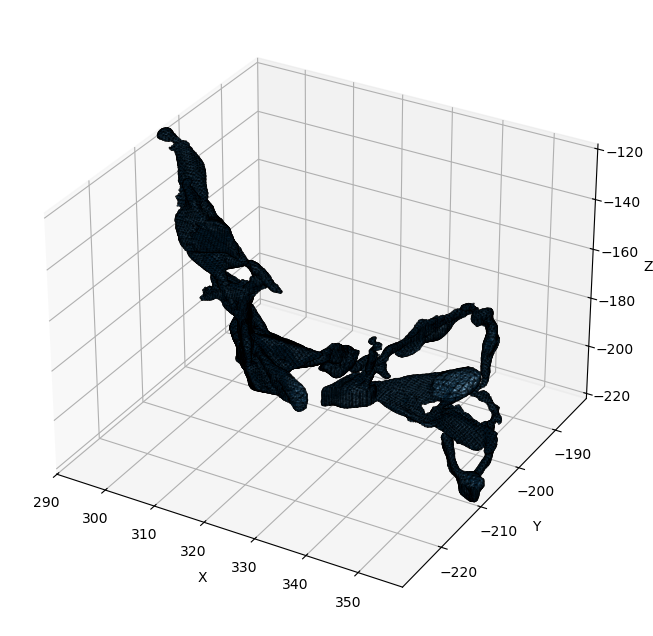

In [16]:
# Création de la figure matplotlib
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection="3d")

# Ajouter le maillage convexe
mesh_collection = Poly3DCollection(verts[faces], alpha=0.3, edgecolor="k")
ax.add_collection3d(mesh_collection)

# Ajuster les limites
ax.set_xlim(verts[:,0].min(), verts[:,0].max())
ax.set_ylim(verts[:,1].min(), verts[:,1].max())
ax.set_zlim(verts[:,2].min(), verts[:,2].max())

ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

plt.show()

In [17]:

# Récupérer les altitudes min et max
z_min = mesh.bounds[0][2]
z_max = mesh.bounds[1][2]

print('Altitude minimale et maximale du mesh',z_min,z_max)

Altitude minimale et maximale du mesh -222.125748 -118.062584


Cette courbe présente le volume d'eau dans le puits en fonction de la hauteur d'eau mesurée.

In [18]:
# Définir les niveaux d'altitude
niveaux = np.linspace(z_min, z_max, 50)  # 50 niveaux entre z_min et z_max
volumes = []
surface=[]
plan_origine = np.array([0, 0, z_min])

for z in niveaux[:]:
    # Plan horizontal à l'altitude z
    # print(z)
    plan_normal = np.array([0, 0, z])
    # Coupe le mesh
    section = mesh.slice_plane(plane_origin=plan_normal,
                               plane_normal=plan_origine)
    if section is None:
        volumes.append(0)
        continue
    # print(section.volume)
    volumes.append(section.volume)
    surface.append(section.area)
    # # On garde uniquement la partie sous le plan
    # sous_maillage = mesh.copy()
    # sous_maillage = sous_maillage.slice_plane(plane_origin=plan_origine,
    #                                           plane_normal=-plan_normal)

    # # Récupérer les sommets et faces
    # verts = sous_maillage.vertices
    # faces = sous_maillage.faces

    # # Création de la figure matplotlib
    # fig = plt.figure(figsize=(8,8))
    # ax = fig.add_subplot(111, projection="3d")

    # # Ajouter le maillage convexe
    # mesh_collection = Poly3DCollection(verts[faces], alpha=0.3, edgecolor="k")
    # ax.add_collection3d(mesh_collection)

    # # Ajuster les limites
    # ax.set_xlim(verts[:,0].min(), verts[:,0].max())
    # ax.set_ylim(verts[:,1].min(), verts[:,1].max())
    # ax.set_zlim(verts[:,2].min(), verts[:,2].max())

    # ax.set_xlabel("X")
    # ax.set_ylabel("Y")
    # ax.set_zlabel("Z")
    # print(sous_maillage.volume)
    # volumes.append(sous_maillage.volume)

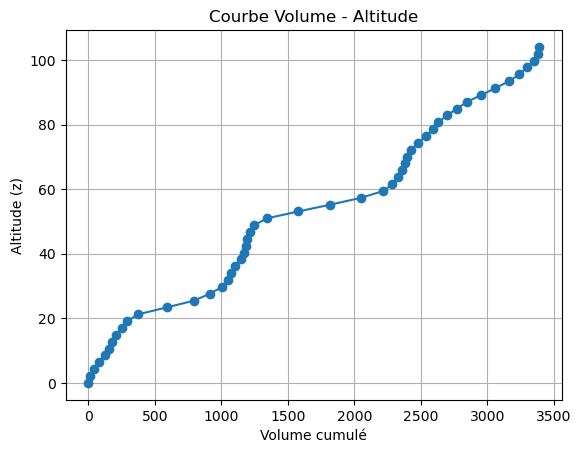

In [19]:
# Afficher la courbe Volume-Altitude
niveaux=niveaux-niveaux.min()
plt.plot(volumes,  niveaux, "-o")
plt.ylabel("Altitude (z)")
plt.xlabel("Volume cumulé")
plt.title("Courbe Volume - Altitude")
plt.grid(True)
plt.show()

## <a id='toc1_5_'></a>[Traitements des données](#toc0_)


### Conversion d'une hauteur d'eau en volume

Par une interpolation suivant un modèle "cubic", nous définissons une fonction de conversion d'une hauteur d'eau vers un volume d'eau.

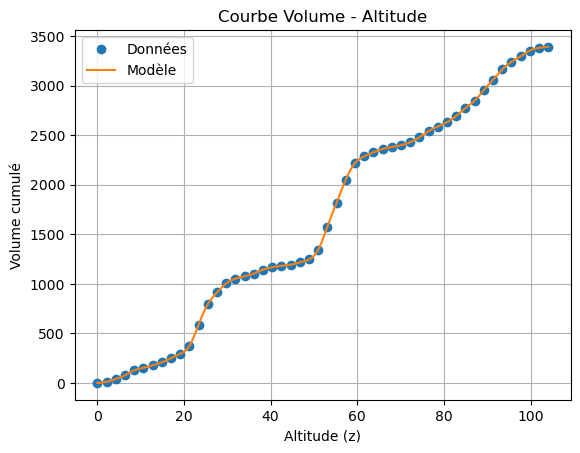

In [20]:
V_of_h = interp1d(niveaux, volumes, kind="cubic")#, fill_value="extrapolate")

niveaux_fins = np.linspace(niveaux.min(), niveaux.max(), 200)
volumes_interp = V_of_h(niveaux_fins)

plt.plot(niveaux, volumes, "o", label='Données')
plt.plot(niveaux_fins, volumes_interp, "-", label='Modèle')
plt.xlabel("Altitude (z)")
plt.ylabel("Volume cumulé")
plt.title("Courbe Volume - Altitude")
plt.legend()
plt.grid(True)
plt.show()



Conversion des hauteurs d'eau des reefnets en volume d'eau. 

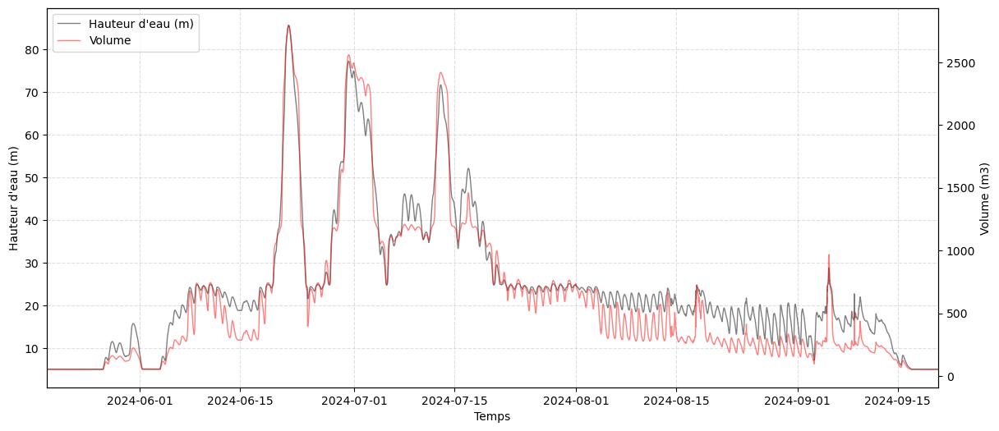

In [21]:

# ----------------------------
# 3. Calcul du volume correspondant
data_siphon_resample["Volume"] = V_of_h(data_siphon_resample['Hauteur_eau_siphon'])

# Création de la figure et des axes
fig, ax = plt.subplots(figsize=(14, 6))

# Limites en x
ax.set_xlim(datetime(2024, 5, 19, 0, 0), datetime(2024, 9, 20, 16, 0))

# Premier axe (gauche)
l1, = ax.plot(data_siphon_resample.index, data_siphon_resample["Hauteur_eau_siphon"], c='k', linewidth=1, alpha=0.5, label="Hauteur d'eau (m)")
ax.set_xlabel("Temps")
ax.set_ylabel("Hauteur d'eau (m)")

# Deuxième axe (droite)
ax1 = ax.twinx()
l2, = ax1.plot(data_siphon_resample.index, data_siphon_resample["Volume"], c='r', linewidth=1, alpha=0.5, label="Volume")
ax1.set_ylabel("Volume (m3)")

# Grille + titre
ax.grid(True, linestyle="--", alpha=0.4)

# Légende combinée
lines = [l1, l2]
labels = [line.get_label() for line in lines]
ax.legend(lines, labels, loc="upper left")

# Affichage
plt.show()


### Détermination des phases de mises en charge

En calculant la dérivé en chaque point de la courbe, nous déterminons les périodes de mise en charge et de vidange de la cavité. L'utilisation d'un seuil à 0.1 m/h, nous fait filter possiblement un peu trop certaines phase mais permet de conserver une continuité sur les mises en charge de grande ampleur.

#### Hauteur

In [22]:
df = data_siphon_resample.copy()

# --- Calcul des dérivées
df["dh"] = df["Hauteur_eau_siphon"].diff()
df["dt"] = df.index.to_series().diff().dt.total_seconds() / 3600  # en heures
df["dh_dt"] = df["dh"] / df["dt"]

In [23]:

# --- Classification en phases
epsilon = 0.01  # seuil en m/h (ajuste selon précision capteur)
conditions = [
    df["dh_dt"] > epsilon,
    df["dh_dt"] < -epsilon,
]
choices = ["charge", "decharge"]
df["phase"] = np.select(conditions, choices, default="stable")

# --- Détection des épisodes continus
df["phase_change"] = df["phase"].ne(df["phase"].shift()).cumsum()
episodes = (
    df.groupby("phase_change")
      .agg(phase=("phase","first"),
           start=("Hauteur_eau_siphon", "first"),
           end=("Hauteur_eau_siphon", "last"),
           t_start=("Hauteur_eau_siphon", lambda x: x.index[0]),
           t_end=("Hauteur_eau_siphon", lambda x: x.index[-1]))
)

# Calcul des durées et amplitudes
episodes["duree_h"] = (episodes["t_end"] - episodes["t_start"]).dt.total_seconds() / 3600
episodes["delta_h"] = episodes["end"] - episodes["start"]
episodes['Vitesse(m/h)']=episodes['delta_h']/episodes['duree_h']
episodes_clean=episodes[(episodes["delta_h"].abs() > 1) &    (episodes["duree_h"] > 0.5)]
print(len(episodes_clean))

# --- Option de lissage pour réduire le bruit (moyenne mobile sur 3 points)
df["dh_dt_smooth"] = df["dh_dt"].rolling(3, center=True).mean()
epsilon = 0.001
df["phase"] = np.select(
    [df["dh_dt_smooth"] > epsilon,
     df["dh_dt_smooth"] < -epsilon],
    ["charge", "decharge"],
    default="stable"
)



239


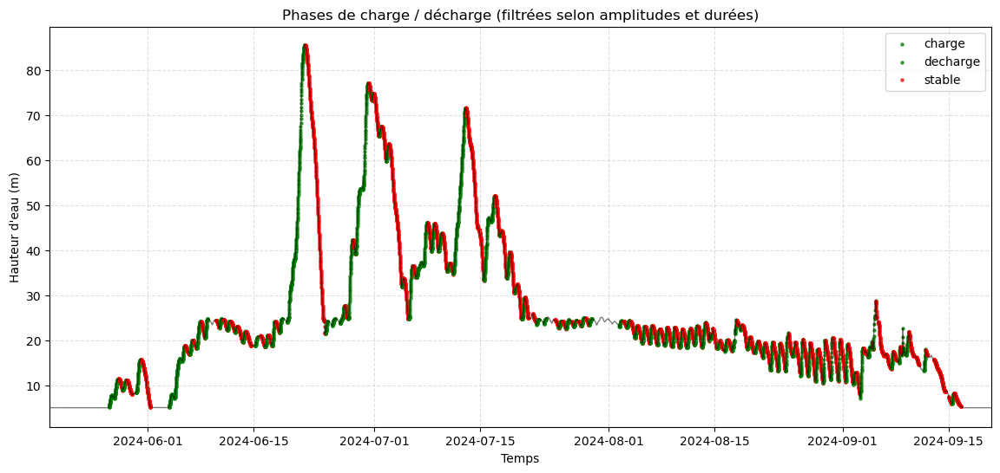

In [24]:
colors = {"charge": "green", "decharge": "red", "stable": "blue"}

plt.figure(figsize=(14,6))
for _, row in episodes_clean.iterrows():
    # Extraire le segment correspondant dans df
    segment = df.loc[row["t_start"]:row["t_end"]]
    plt.scatter(segment.index, segment["Hauteur_eau_siphon"],
                color=colors[row["phase"]], s=5, alpha=0.7)

plt.xlim(datetime(2024, 5, 19, 0, 0), datetime(2024, 9, 20, 16, 0))
plt.xlabel("Temps")
plt.ylabel("Hauteur d'eau (m)")
plt.legend(colors.keys())
plt.plot(df.index,df["Hauteur_eau_siphon"],c='k',linewidth=1,alpha=0.5)
plt.grid(True, linestyle="--", alpha=0.4)
plt.title("Phases de charge / décharge (filtrées selon amplitudes et durées)")
plt.show()


#### Volume

In [25]:
df_V = data_siphon_resample.copy()

df_V["dV"] = df_V["Volume"].diff()
df_V["dV_dt"] = df_V["dV"] / df_V.index.to_series().diff().dt.total_seconds()

488


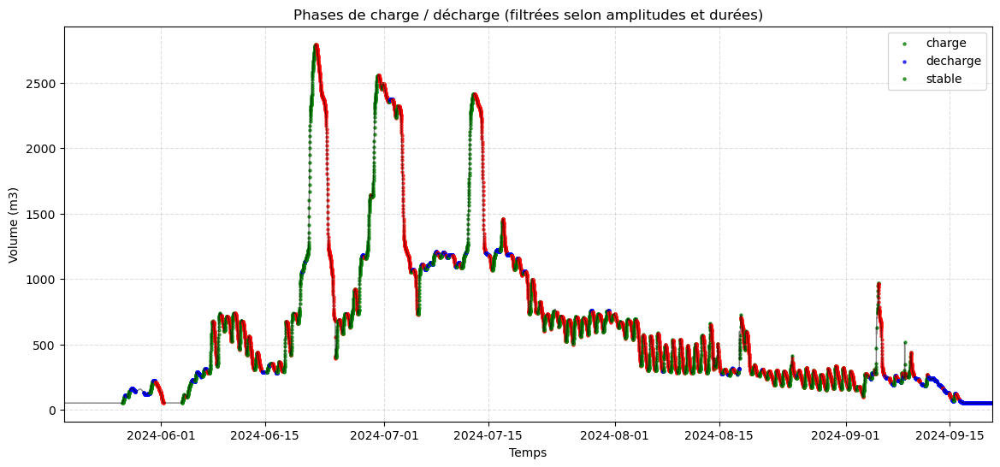

In [26]:

# --- Classification en phases
epsilon = 0.001  # seuil en m3/h (ajuste selon précision capteur)
conditions = [
    df_V["dV_dt"] > epsilon,
    df_V["dV_dt"] < -epsilon,
]
choices = ["charge", "decharge"]
df_V["phase"] = np.select(conditions, choices, default="stable")

# --- Détection des épisodes continus
df_V["phase_change"] = df_V["phase"].ne(df_V["phase"].shift()).cumsum()
episodes_V = (
    df_V.groupby("phase_change")
      .agg(phase=("phase","first"),
           start=("Volume", "first"),
           end=("Volume", "last"),
           t_start=("Volume", lambda x: x.index[0]),
           t_end=("Volume", lambda x: x.index[-1]))
)

# Calcul des durées et amplitudes
episodes_V["duree_h"] = (episodes_V["t_end"] - episodes_V["t_start"]).dt.total_seconds() / 3600
episodes_V["delta_V"] = episodes_V["end"] - episodes_V["start"]
episodes_V['Debits (m3/h)']=episodes_V['delta_V']/episodes_V['duree_h']
episodes_V_clean=episodes_V[(episodes_V["delta_V"].abs() > 1) &    (episodes_V["duree_h"] > 0.5)]
print(len(episodes_V_clean))

# # --- Option de lissage pour réduire le bruit (moyenne mobile sur 3 points)
# df["dh_dt_smooth"] = df["dh_dV"].rolling(3, center=True).mean()
# epsilon = 0.001
# df["phase"t = np.select(
#     [df["dh_dt_smooth"] > epsilon,
#      df["dh_dt_smooth"] < -epsilon],
#     ["charge", "decharge"],
#     default="stable"
# )

colors = {"charge": "green", "decharge": "red", "stable": "blue"}

plt.figure(figsize=(14,6))
for _, row in episodes_V_clean.iterrows():
    # Extraire le segment correspondant dans df
    segment = df_V.loc[row["t_start"]:row["t_end"]]
    plt.scatter(segment.index, segment["Volume"],
                color=colors[row["phase"]], s=5, alpha=0.7)

plt.xlim(datetime(2024, 5, 19, 0, 0), datetime(2024, 9, 20, 16, 0))
plt.xlabel("Temps")
plt.ylabel("Volume (m3)")
plt.legend(colors.keys())
plt.plot(df_V.index,df_V["Volume"],c='k',linewidth=1,alpha=0.5)
plt.grid(True, linestyle="--", alpha=0.4)
plt.title("Phases de charge / décharge (filtrées selon amplitudes et durées)")
plt.show()

### Etude de la mise en charge

La mise en charge est linéaire dans ce conduit karstique. Nous appliquons une régréssion linéaire sur chacune des phases de mise en charge identifiées. La figure ci-dessous représente la plus grande mise en charge enregistrée.

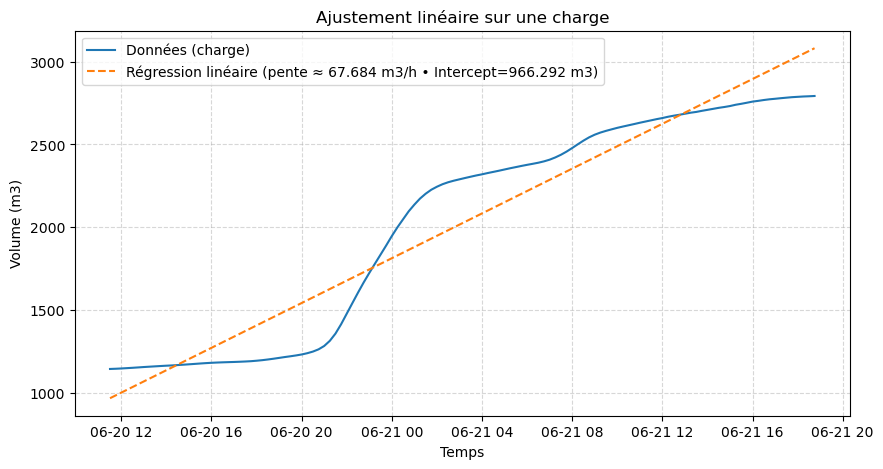

In [27]:

# --- Préparation
episodes_charge = episodes_V_clean.reset_index(drop=True)
episodes_charge = episodes_charge[episodes_charge["phase"] == "charge"].copy()



# === Appliquer à chaque épisode de charge ===
slope_list, intercept_list, r2_list = [], [], []

for i, row in episodes_charge.iterrows():
    sdf = df.loc[row["t_start"]:row["t_end"]]
    slope, intercept, r2 = fit_slope(sdf,"Volume")
    slope_list.append(slope)
    intercept_list.append(intercept)
    r2_list.append(r2)

episodes_charge["slope"] = slope_list             # m / h
episodes_charge["intercept"] = intercept_list     # m
episodes_charge["R2_lin"] = r2_list

# === Exemple de tracé sur la plus longue charge ===
if not episodes_charge.empty:
    idx = episodes_charge["duree_h"].idxmax()
    row = episodes_charge.loc[idx]
    sdf = df.loc[row["t_start"]:row["t_end"]]

    t = (sdf.index - sdf.index[0]).total_seconds() / 3600
    h = sdf["Volume"].values

    slope = row["slope"]
    intercept = row["intercept"]
    h_model = slope * t + intercept

    plt.figure(figsize=(10, 5))
    plt.plot(sdf.index, h, label="Données (charge)")
    plt.plot(sdf.index, h_model, "--", label=f"Régression linéaire (pente ≈ {slope:.3f} m3/h • Intercept={intercept:.3f} m3)")
    plt.xlabel("Temps")
    plt.ylabel("Volume (m3)")
    plt.title("Ajustement linéaire sur une charge")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()

Représentation statistique de la mise en charge du conduit karstique

In [28]:
# --- Statistiques descriptives ---
print("📊 Analyse descriptive :")
print("Mise en charge niveau initiale :")
print(f" - Moyenne : {episodes_charge['intercept'].mean():.4f} m3")
print(f" - Médiane : {episodes_charge['intercept'].median():.4f} m3")
print(f" - Ecart-type : {episodes_charge['intercept'].std():.4f} m3")
print(f" - Min : {episodes_charge['intercept'].min():.4f} m3")
print(f" - Max : {episodes_charge['intercept'].max():.4f} m3")
print(f" - Skewness : {episodes_charge['intercept'].skew():.4f}")
print(f" - Kurtosis : {episodes_charge['intercept'].kurtosis():.4f}\n")

print("Pente :")
print(f" - Moyenne : {episodes_charge['slope'].mean():.4f} m3")
print(f" - Médiane : {episodes_charge['slope'].median():.4f} m3")
print(f" - Ecart-type : {episodes_charge['slope'].std():.4f} m3")
print(f" - Min : {episodes_charge['slope'].min():.4f} m3")
print(f" - Max : {episodes_charge['slope'].max():.4f} m3")
print(f" - Skewness : {episodes_charge['slope'].skew():.4f}")
print(f" - Kurtosis : {episodes_charge['slope'].kurtosis():.4f}\n")

📊 Analyse descriptive :
Mise en charge niveau initiale :
 - Moyenne : 470.3506 m3
 - Médiane : 288.7153 m3
 - Ecart-type : 419.9238 m3
 - Min : -53.1549 m3
 - Max : 2453.8919 m3
 - Skewness : 2.2048
 - Kurtosis : 6.6163

Pente :
 - Moyenne : 32.5450 m3
 - Médiane : 19.7532 m3
 - Ecart-type : 42.7715 m3
 - Min : 3.7052 m3
 - Max : 327.3310 m3
 - Skewness : 4.0018
 - Kurtosis : 20.2876



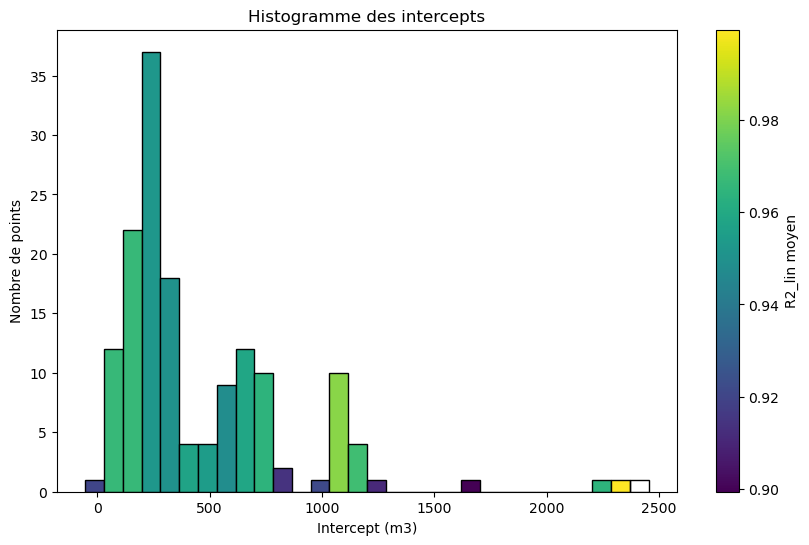

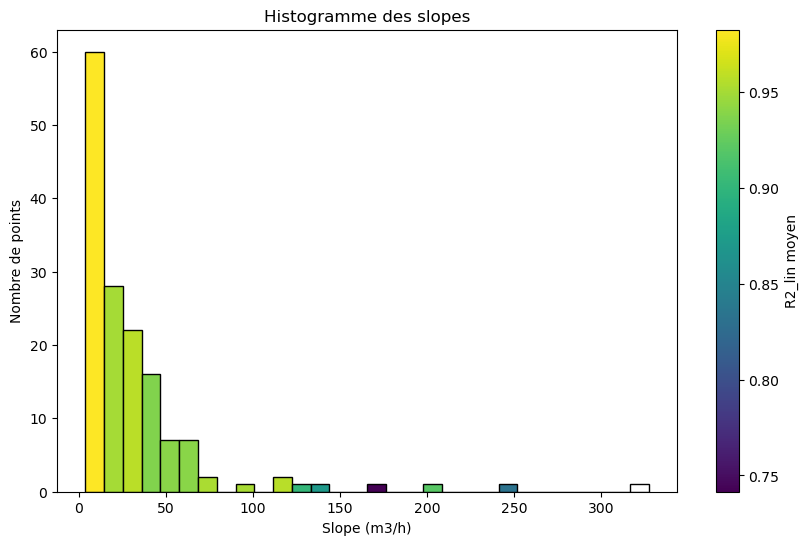

In [29]:

# --- Histogrammes
hist_colored_by_values(episodes_charge['intercept'].values, episodes_charge['R2_lin'].values,
                   nb_bins=30, title="Histogramme des intercepts", xlabel="Intercept (m3)")

hist_colored_by_values(episodes_charge['slope'].values, episodes_charge['R2_lin'].values,
                   nb_bins=30, title="Histogramme des slopes", xlabel="Slope (m3/h)")



### Etude de la vidange
La vidange est linéaire dans ce conduit karstique. Nous appliquons une régréssion linéaire sur chacune des phases de vidange identifiées. La figure ci-dessous représente la plus grande vidange enregistrée.

In [30]:
# === Sélectionner uniquement les épisodes de décharge significatifs ===
episodes_decharge = episodes_V_clean.reset_index(drop=True)
episodes_decharge = episodes_decharge[episodes_decharge["phase"]=="decharge"].copy()



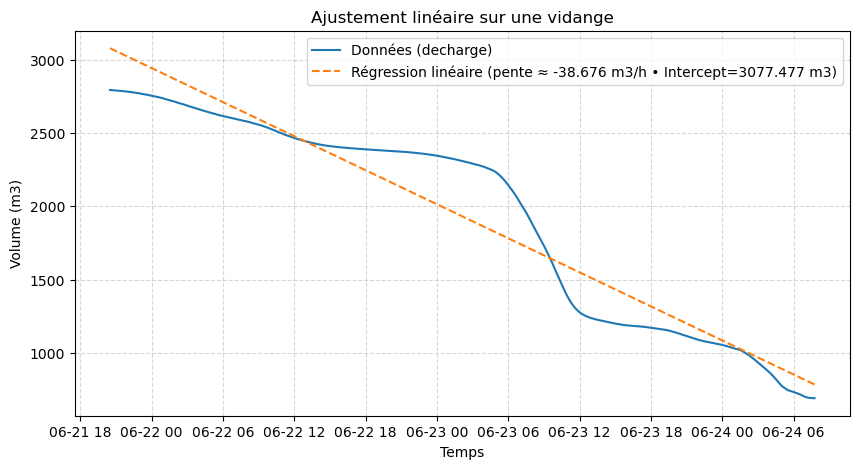

In [31]:
# === Appliquer à chaque épisode de decharge ===
slope_list, intercept_list, r2_list = [], [], []

for i, row in episodes_decharge.iterrows():
    sdf = df.loc[row["t_start"]:row["t_end"]]
    slope, intercept, r2 = fit_slope(sdf,"Volume")
    slope_list.append(slope)
    intercept_list.append(intercept)
    r2_list.append(r2)

episodes_decharge["slope"] = slope_list             # m / h
episodes_decharge["intercept"] = intercept_list     # m
episodes_decharge["R2_lin"] = r2_list

# === Exemple de tracé sur la plus longue decharge === 
if not episodes_decharge.empty:
    idx = episodes_decharge["duree_h"].idxmax()
    row = episodes_decharge.loc[idx]
    sdf = df.loc[row["t_start"]:row["t_end"]]

    t = (sdf.index - sdf.index[0]).total_seconds() / 3600
    h = sdf["Volume"].values

    slope = row["slope"]
    intercept = row["intercept"]
    h_model = slope * t + intercept

    plt.figure(figsize=(10, 5))
    plt.plot(sdf.index, h, label="Données (decharge)")
    plt.plot(sdf.index, h_model, "--", label=f"Régression linéaire (pente ≈ {slope:.3f} m3/h • Intercept={intercept:.3f} m3)")
    plt.xlabel("Temps")
    plt.ylabel("Volume (m3)")
    plt.title("Ajustement linéaire sur une vidange")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()

Représentation statistique de vidange du conduit karstique

📊 Analyse descriptive :
Décrues niveau résiduel :
 - Moyenne : 568.9290 m3
 - Médiane : 438.7851 m3
 - Ecart-type : 487.1926 m3
 - Min : 68.9528 m3
 - Max : 3077.4772 m3
 - Skewness : 2.5246
 - Kurtosis : 8.1915

pente :
 - Moyenne : -15.2367 m3
 - Médiane : -9.0697 m3
 - Ecart-type : 18.5308 m3
 - Min : -179.9399 m3
 - Max : -3.7027 m3
 - Skewness : -4.8430
 - Kurtosis : 33.7734



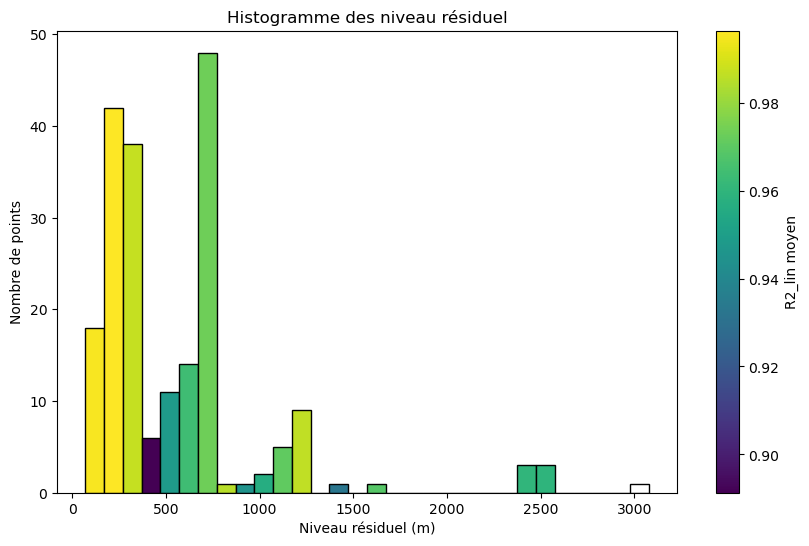

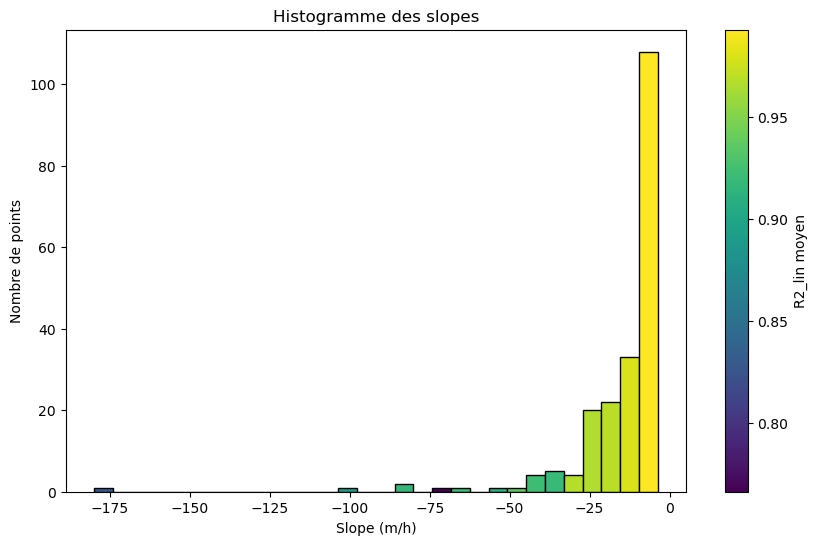

In [32]:


# --- Statistiques descriptives ---
print("📊 Analyse descriptive :")
print("Décrues niveau résiduel :")
print(f" - Moyenne : {episodes_decharge['intercept'].mean():.4f} m3")
print(f" - Médiane : {episodes_decharge['intercept'].median():.4f} m3")
print(f" - Ecart-type : {episodes_decharge['intercept'].std():.4f} m3")
print(f" - Min : {episodes_decharge['intercept'].min():.4f} m3")
print(f" - Max : {episodes_decharge['intercept'].max():.4f} m3")
print(f" - Skewness : {episodes_decharge['intercept'].skew():.4f}")
print(f" - Kurtosis : {episodes_decharge['intercept'].kurtosis():.4f}\n")

print("pente :")
print(f" - Moyenne : {episodes_decharge['slope'].mean():.4f} m3")
print(f" - Médiane : {episodes_decharge['slope'].median():.4f} m3")
print(f" - Ecart-type : {episodes_decharge['slope'].std():.4f} m3")
print(f" - Min : {episodes_decharge['slope'].min():.4f} m3")
print(f" - Max : {episodes_decharge['slope'].max():.4f} m3")
print(f" - Skewness : {episodes_decharge['slope'].skew():.4f}")
print(f" - Kurtosis : {episodes_decharge['slope'].kurtosis():.4f}\n")

# --- Histogrammes
hist_colored_by_values(episodes_decharge['intercept'].values, episodes_decharge['R2_lin'].values,
                   nb_bins=30, title="Histogramme des niveau résiduel", xlabel="Niveau résiduel (m)")

hist_colored_by_values(episodes_decharge['slope'].values, episodes_decharge['R2_lin'].values,
                   nb_bins=30, title="Histogramme des slopes", xlabel="Slope (m/h)")





Capacité de stockage (calculée en reliant variation de niveau à variation de volume si tu connais la géométrie de la cavité).

### Corrélation avec les données météos

Nous avons cherché les corrélations avec les données météos observées à la station Meteo-France de Tignes. Nous réalisons un shift de 4°C de la température à Tignes pour compenser la différence d'altitude avec l'entrée de la grotte.

La corrélation entre la tempréature en surface et les hauteurs d'eau est importante. Un coeeficient de corrélation de 0.83 est obtenu quand nous réalisons un shift de 7h de la témpérature. Nous avons sélectionné une fênetre temporelle sans précipitation et présentant un signal journalier de fonte important.

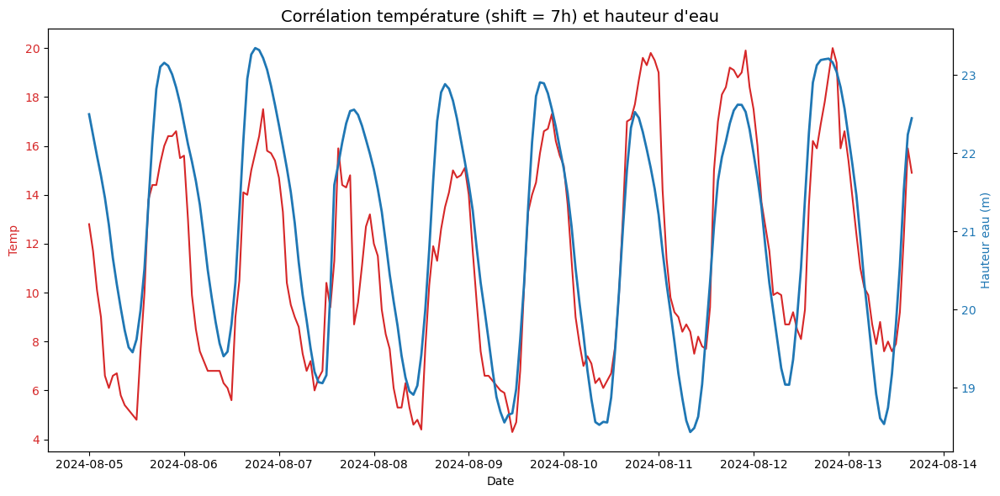

479 [[1.         0.83529728]
 [0.83529728 1.        ]]


In [33]:

date1=datetime(2024, 8, 5, 0, 0) 
date2=datetime(2024, 8, 13, 16, 0)


mask = (DATA_CLIMAT_h.index >= date1) & (DATA_CLIMAT_h.index <= date2)
DATA_CLIMAT_h_mask=DATA_CLIMAT_h.shift(7).loc[mask]
mask = (data_siphon_resample.index >= date1) & (data_siphon_resample.index <= date2)
data_siphon_resample60=data_siphon_resample.loc[mask].resample('60min').mean()


fig, ax_precip = plt.subplots(figsize=(12,6))

# Axe principal pour les précipitations
# ax_precip.plot(DATA_CLIMAT_h_mask.index, DATA_CLIMAT_h_mask['RR1'], label='Précipitations',color='tab:cyan', alpha=1)
ax_precip.plot(DATA_CLIMAT_h_mask.index, DATA_CLIMAT_h_mask['T']-4, label='Température',color='tab:Red', alpha=1)

ax_precip.set_ylabel('Temp', color='tab:red')
ax_precip.tick_params(axis='y', labelcolor='tab:red')

# Axe secondaire pour la hauteur d'eau
ax_siphon = ax_precip.twinx()
ax_siphon.plot(data_siphon_resample60.index, data_siphon_resample60['Hauteur_eau_siphon'], 
            label='Hauteur eau siphon', color='tab:blue', linewidth=2)
ax_siphon.set_ylabel('Hauteur eau (m)', color='tab:blue')
ax_siphon.tick_params(axis='y', labelcolor='tab:blue')

ax_precip.set_xlabel('Date')
# ax_precip.set_xlim(datetime(2024, 7, 19, 0, 0), datetime(2024, 9, 1, 16, 0))
ax_precip.set_title("Corrélation température (shift = 7h) et hauteur d'eau", fontsize=14)
plt.tight_layout()
plt.show()

data_siphon_resample60['T'] = DATA_CLIMAT_h_mask['T']

scicorr=np.corrcoef(data_siphon_resample60['T'],data_siphon_resample60['Hauteur_eau_siphon'])
print(i,scicorr)


Comparer la réponse en fonction des pluies ou apports (corrélation pluie–niveau).

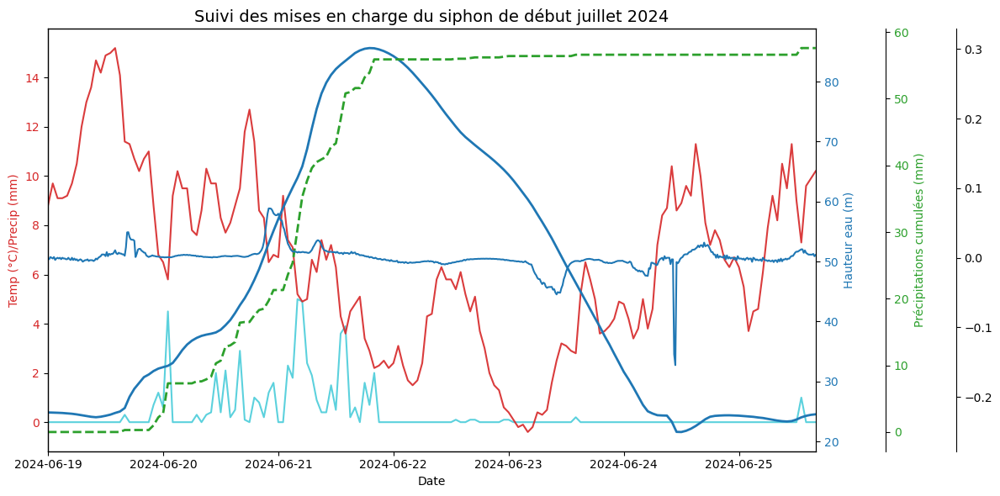

In [34]:

date1=datetime(2024, 6, 14, 0, 0) 
date2=datetime(2024, 7, 25, 16, 0)


date1=datetime(2024, 6, 19, 0, 0) 
date2=datetime(2024, 6, 25, 16, 0)


# Masque temporel

mask = (DATA_CLIMAT_h.index >= date1) & (DATA_CLIMAT_h.index <= date2)
DATA_CLIMAT_mask_mean=DATA_CLIMAT_h.loc[mask]
DATA_CLIMAT_mask_sum=DATA_CLIMAT_h.rolling(6).sum().shift(0).loc[mask]

mask = (data_siphon_resample.index >= date1) & (data_siphon_resample.index <= date2)
data_siphon_resample60 = data_siphon_resample.loc[mask].resample('60min').mean()

# Création de la figure
fig, ax_precip = plt.subplots(figsize=(12,6))

# Axe principal pour température et précipitations instantanées
ax_precip.plot(DATA_CLIMAT_mask_mean.index, DATA_CLIMAT_mask_mean['RR1'], 
               label='Précipitations', color='tab:cyan', alpha=0.7)
ax_precip.plot(DATA_CLIMAT_mask_mean.index, DATA_CLIMAT_mask_mean['T']-4, 
               label='Température', color='tab:red', alpha=0.9)

ax_precip.set_ylabel('Temp (°C)/Precip (mm)', color='tab:red')
ax_precip.tick_params(axis='y', labelcolor='tab:red')

# Axe secondaire pour hauteur d'eau
ax_siphon = ax_precip.twinx()
ax_siphon.plot(data_siphon_resample60.index, data_siphon_resample60['Hauteur_eau_siphon'], 
               label='Hauteur eau siphon', color='tab:blue', linewidth=2)
ax_siphon.set_ylabel('Hauteur eau (m)', color='tab:blue')
ax_siphon.tick_params(axis='y', labelcolor='tab:blue')

# === Ajout des précipitations cumulées ===
ax_cum = ax_precip.twinx()  # Crée un 3ème axe
ax_cum.spines['right'].set_position(('outward', 60))  # Décale l'axe pour éviter chevauchement
cum_precip = DATA_CLIMAT_mask_mean['RR1'].cumsum()
ax_cum.plot(DATA_CLIMAT_mask_sum.index, cum_precip, 
            label='Précipitations cumulées', color='tab:green', linestyle='--', linewidth=2)
ax_cum.set_ylabel('Précipitations cumulées (mm)', color='tab:green')
ax_cum.tick_params(axis='y', labelcolor='tab:green')

ax_debit = ax_precip.twinx()
ax_debit.spines['right'].set_position(('outward', 120))
ax_debit.plot(df_V.index,df_V["dV_dt"] )

# Mise en forme
ax_precip.set_xlabel('Date')
ax_precip.set_title('Suivi des mises en charge du siphon de début juillet 2024', fontsize=14)
ax_precip.set_xlim([date1,date2])
fig.tight_layout()

# Affichage
plt.show()




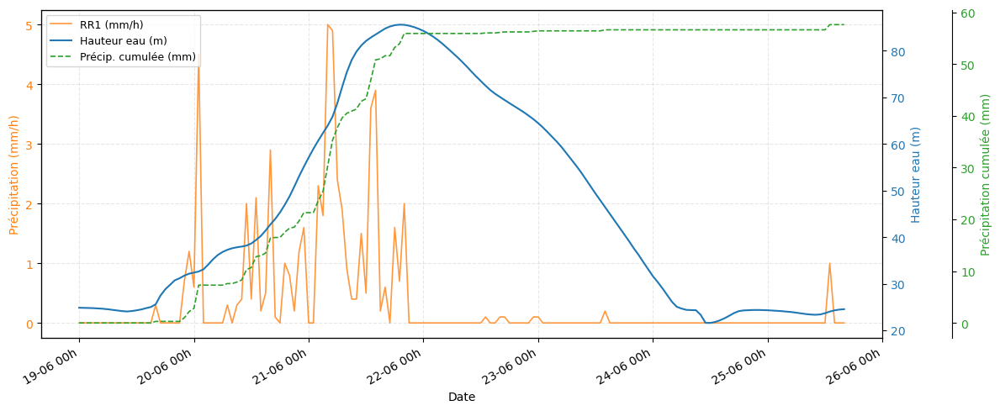

In [35]:
# alignement et remplissage
precip = DATA_CLIMAT_mask_mean['RR1'].fillna(0)
water = data_siphon_resample60['Hauteur_eau_siphon'].resample('60min').mean().interpolate()
# cumulative
precip_cum = precip.cumsum()


fig, ax = plt.subplots(figsize=(12,5))

# --- Courbe précipitation horaire ---
color1 = "tab:orange"
ax.plot(precip.index, precip, label="RR1 (mm/h)", color=color1, linewidth=1.2, alpha=0.8)
ax.set_ylabel("Précipitation (mm/h)", color=color1)
ax.tick_params(axis="y", labelcolor=color1)
ax.grid(True, linestyle="--", alpha=0.3)

# --- Courbe hauteur eau ---
ax2 = ax.twinx()
color2 = "tab:blue"
ax2.plot(water.index, water, label="Hauteur eau (m)", color=color2, linewidth=1.5)
ax2.set_ylabel("Hauteur eau (m)", color=color2)
ax2.tick_params(axis="y", labelcolor=color2)

# --- Courbe précipitation cumulée ---
ax3 = ax.twinx()
color3 = "tab:green"
ax3.spines["right"].set_position(("outward", 60))   # Décalage axe Y à droite
ax3.plot(precip_cum.index, precip_cum, "--", label="Précip. cumulée (mm)", color=color3, linewidth=1.2)
ax3.set_ylabel("Précipitation cumulée (mm)", color=color3)
ax3.tick_params(axis="y", labelcolor=color3)

# --- Axe X : lisibilité améliorée ---
ax.set_xlabel("Date")
ax.xaxis.set_major_formatter(mdates.DateFormatter("%d-%m %Hh"))
plt.setp(ax.get_xticklabels(), rotation=30, ha="right")

# --- Légendes séparées ---
lines, labels = [], []
for a in [ax, ax2, ax3]:
    l, lab = a.get_legend_handles_labels()
    lines.extend(l)
    labels.extend(lab)
ax.legend(lines, labels, loc="upper left", frameon=True, fontsize=9)

plt.tight_layout()
plt.show()

Un temps de latence de 21-22h est identifié entre les précipitations et la mise en charge du réseau. Ce résultat pose question car la fonte est active au même moment et vient etre amplifié par les précipitations liquides.

Lag max (heures): -22 => -0.9166666666666666 jours


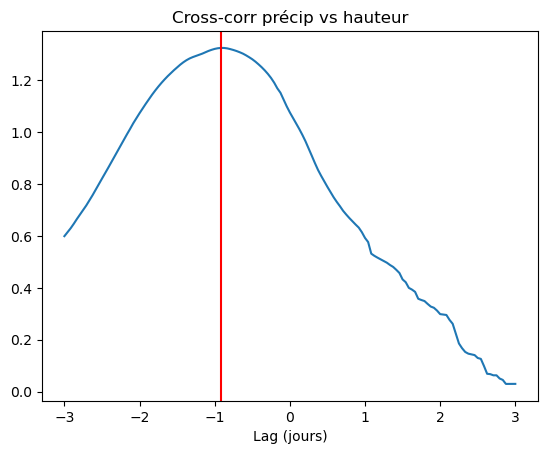

In [36]:
p = precip
h = water

# cross-correlation (numpy.correlate)
xc = np.correlate(p, h, mode='full')
lags = np.arange(-len(p)+1, len(p))
# restreindre aux lags plausibles (par ex -7 jours .. +30 jours)
maxlag_hours = 24*3
center = len(xc)//2
xc_short = xc[center-maxlag_hours:center+maxlag_hours+1]
lags_short = lags[center-maxlag_hours:center+maxlag_hours+1]

# normaliser (facultatif)
xc_norm = xc_short / (np.std(p)*np.std(h)*len(p))

lag_best = lags_short[np.argmax(xc_norm)]
print("Lag max (heures):", lag_best, "=>", lag_best/24, "jours")
plt.figure()

plt.plot(lags_short/24, xc_norm); plt.axvline(lag_best/24, color='red'); plt.xlabel('Lag (jours)')
plt.title('Cross-corr précip vs hauteur'); plt.show()


Best lag = 21.0 heures (0.88 jours)
Corrélation maximale = 0.501


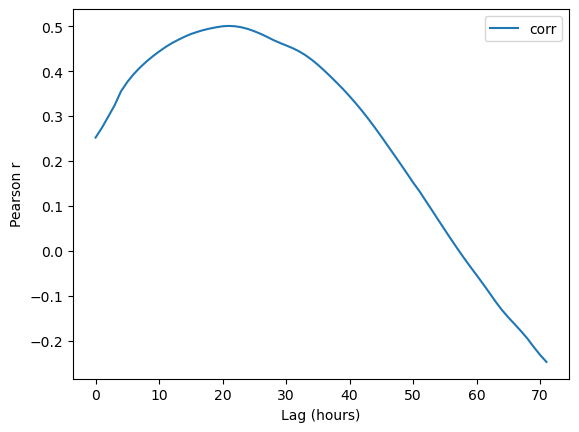

In [37]:
import pandas as pd
lags = range(0, 24*3, 1)  # tous les 6h jusqu'à 14 jours
results = []
for L in lags:
    p_lag = precip.shift(L).rolling(window=1).sum()   # ex: cumulé 24h, décalé L heures
    valid = p_lag.dropna().index.intersection(water.dropna().index)
    corr = p_lag.loc[valid].corr(water.loc[valid])
    results.append((L, corr))
df_lags = pd.DataFrame(results, columns=['lag_hours','corr'])
df_lags.plot(x='lag_hours', y='corr'); plt.xlabel('Lag (hours)'); plt.ylabel('Pearson r')

best_row = df_lags.loc[df_lags['corr'].idxmax()]
bestlag = best_row['lag_hours']
bestcorr = best_row['corr']

print(f"Best lag = {bestlag} heures ({bestlag/24:.2f} jours)")
print(f"Corrélation maximale = {bestcorr:.3f}")

## <a id='toc1_6_'></a>[Analyse](#toc0_)


### Traçage hydrologique

#### Gouille de Salin

##### Calibration du GGUN FL30


|                      | Blanc  | Solution 1      | Solution 2   | Solution 3      |
| -------------------- | ------ | ---------- | ------- | ---------- |
| Concentration (ug/L) | 0      | 92.0070929 | 577.000 | 1257.43027 |
| Valeur               | 163.82 | 372.96     | 1825.74 | 2486.06    |

Le blanc est réalisé sur l'eau de la Gouille de Salin durant 10 jours. Cette valeur soustraite au signal brut avant conversion.

Nous avons choisi de réaliser une courbe de calibration linéaire. Une polynomiale de degré 2 ne permettait pas d'obtenir de résultats croissants. Nous avons également essayé une courbe log10. 

Nous forçons 


In [38]:
# ----------------------------------------------------
# 1. Blanc = moyenne des 10 premiers jours
# ----------------------------------------------------

premiers_jours = data_gouille.index.normalize().unique()[:10]
mask_10j = data_gouille.index.normalize().isin(premiers_jours)

valeur_blanc = data_gouille.loc[mask_10j, 'Tracer 1'].mean()

print("Blanc (mV) calculé sur les 10 premiers jours :", valeur_blanc)

Blanc (mV) calculé sur les 10 premiers jours : 3.207344262295082



Fit linéaire :
   slope     = 0.4940580040416685
   intercept = 3.207344262295082


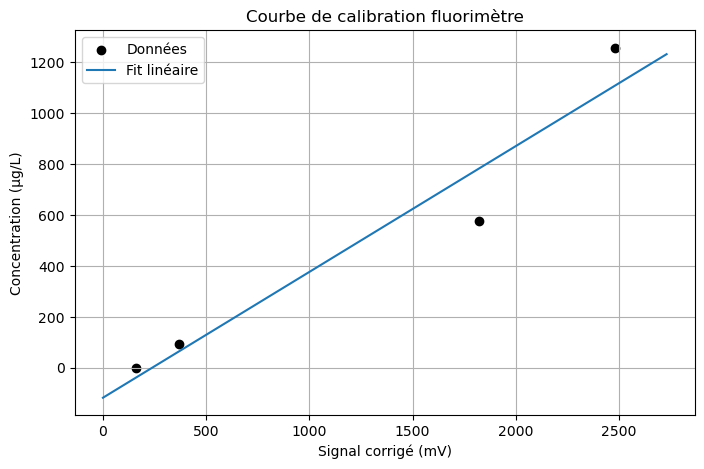

In [39]:
# ----------------------------------------------------
# 2. Données de calibration
# ----------------------------------------------------

conc = np.array([0, 92.00709291, 577.000, 1257.43027])   # ug/L
mV = np.array([163.82,372.96, 1825.74, 2486.06])             # mV mesurés

# Correction du signal par le blanc
mV_corr = mV - valeur_blanc

# ----------------------------------------------------
# 3. Fit linéaire
# ----------------------------------------------------

coef_lin = np.polyfit(mV[:],conc[:], 1)
slope_lin, intercept_lin = coef_lin[0], coef_lin[1]

print("\nFit linéaire :")
print("   slope     =", slope_lin)
print("   intercept =", valeur_blanc)

# ----------------------------------------------------
# 5. Conversion mV → µg/L
# ----------------------------------------------------

def mv_to_ugL_linear(mv):
    mv_corr = mv 
    return (mv_corr*slope_lin + valeur_blanc) 


# ----------------------------------------------------
# 6. Application à data_gouille
# ----------------------------------------------------

data_gouille['Tracer 1 (ug/L) - lin'] = mv_to_ugL_linear(data_gouille['Tracer 1'])

# ----------------------------------------------------
# 7. Visualisation
# ----------------------------------------------------

plt.figure(figsize=(8,5))
plt.scatter(mV_corr, conc, color='black', label='Données')
x = np.linspace(0, max(mV_corr)*1.1, 2500)

plt.plot(x, slope_lin*x + intercept_lin, label='Fit linéaire')


plt.ylabel("Concentration (µg/L)")
plt.xlabel("Signal corrigé (mV)")
plt.legend()
plt.grid()
plt.title("Courbe de calibration fluorimètre")
plt.show()

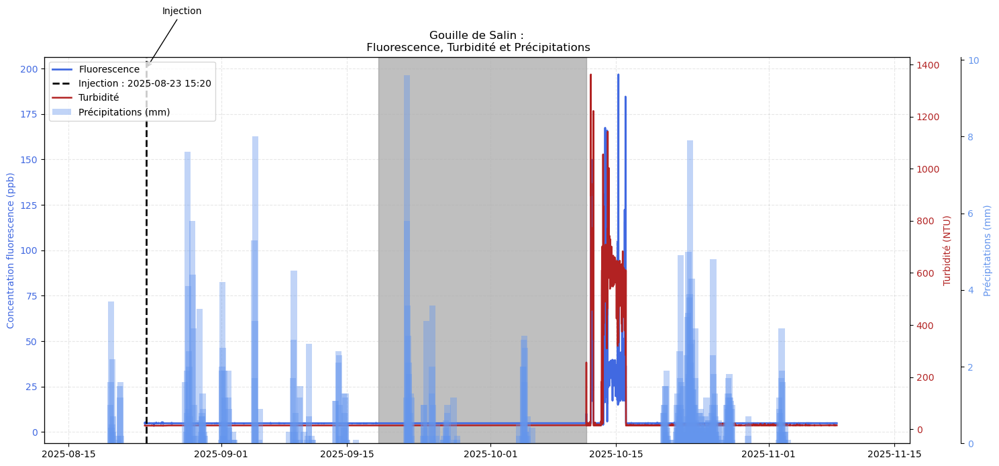

In [40]:
# --- Définition de la période d'analyse ---
start_date = '2025-08-17'
end_date   = '2025-11-12'

data_gouille_crop = data_gouille.loc[start_date:end_date]
DATA_CLIMAT_h_crop = DATA_CLIMAT_h.loc[start_date:end_date]

# --- Figure ---
fig, ax1 = plt.subplots(figsize=(15, 7))

# --- Axe principal : Fluorescence ---
ax1.plot(
    data_gouille_crop.index,
    data_gouille_crop['Tracer 1 (ug/L) - lin'],
    color='royalblue',
    linewidth=2,
    label='Fluorescence'
)

ax1.set_ylabel('Concentration fluorescence (ppb)', color='royalblue')
ax1.tick_params(axis='y', labelcolor='royalblue')

# Zone transparente sur la période
ax1.axvspan(start, end, color='grey', alpha=0.5)

# Ligne verticale de l’injection
ax1.axvline(
    x=inject_date,
    linestyle='--',
    linewidth=2,
    color='black',
    label=f'Injection : {inject_date:%Y-%m-%d %H:%M}'
)

# Annotation propre
ax1.annotate(
    'Injection',
    xy=(inject_date, 200),
    xytext=(datetime(2025, 8, 27, 15, 20), 230),
    ha='center',
    arrowprops=dict(arrowstyle='->', color='black')
)

# --- Axe secondaire : Turbidité ---
ax2 = ax1.twinx()
ax2.plot(
    data_gouille_crop.index,
    data_gouille_crop['Turbidity'],
    color='firebrick',
    linewidth=1.8,
    label='Turbidité'
)

ax2.set_ylabel('Turbidité (NTU)', color='firebrick')
ax2.tick_params(axis='y', labelcolor='firebrick')

# --- Axe tertiaire : Précipitations ---
ax3 = ax1.twinx()
ax3.spines['right'].set_position(("outward", 55))

# largeur de barre = 70% du pas
if len(DATA_CLIMAT_h_crop.index) > 1:
    delta = (DATA_CLIMAT_h_crop.index[1] - DATA_CLIMAT_h_crop.index[0]).total_seconds() / 3600
    bar_width = delta * 0.7
else:
    bar_width = 0.03

ax3.bar(
    DATA_CLIMAT_h_crop.index,
    DATA_CLIMAT_h_crop['RR1'],
    width=bar_width,
    color='cornflowerblue',
    alpha=0.4,
    label='Précipitations (mm)'
)

ax3.set_ylabel('Précipitations (mm)', color='cornflowerblue')
ax3.tick_params(axis='y', labelcolor='cornflowerblue')

# --- Fusion des légendes ---
lines = []
labels = []
for ax in [ax1, ax2, ax3]:
    l, lab = ax.get_legend_handles_labels()
    lines += l
    labels += lab

ax1.legend(lines, labels, loc='upper left')

# --- Finitions ---
ax1.grid(True, which='both', linestyle='--', alpha=0.3)
plt.title("Gouille de Salin :\n Fluorescence, Turbidité et Précipitations")
plt.xlabel("Date")
plt.tight_layout()
plt.show()


##### Calcul de la masse de fluorésceine 

Intégration de la concentration de fluorésceine dans le temps. Nous avons choisi d'intégrer que les valeurs supérieurs à 5 $\micro$g/l

Débits estimé en moyenne à 200 l/s

Pas de temps 15min


In [41]:


data_gouille['masse']=np.cumsum(data_gouille_crop['Tracer 1 (ug/L) - lin']>5)*200*60*15*10**-6

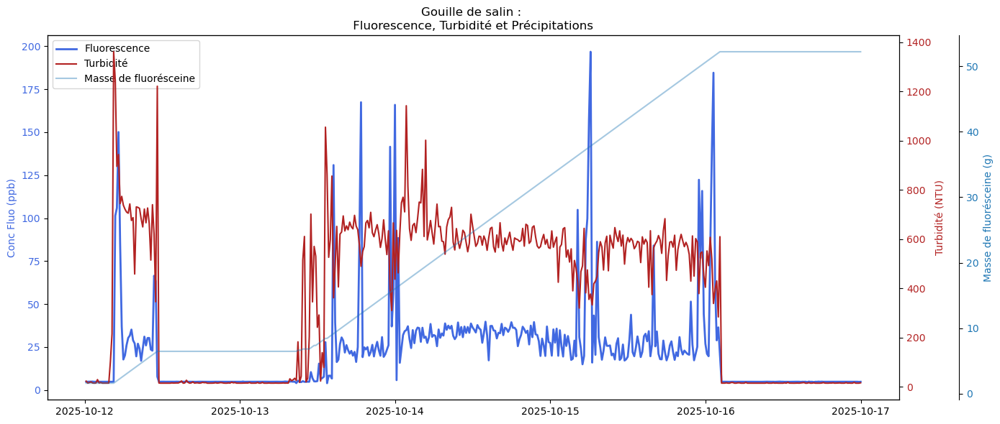

In [42]:

# --- Crop des données sur la période désirée ---
start_date = '2025-10-12'
end_date   = '2025-10-16'

data_gouille_crop = data_gouille.loc[start_date:end_date]
DATA_CLIMAT_h_crop = DATA_CLIMAT_h.loc[start_date:end_date]


# --- Création d'une figure unique ---
fig, ax1 = plt.subplots(figsize=(14, 6))

# Axe principal : Fluorescence
ax1.plot(data_gouille_crop.index, data_gouille_crop['Tracer 1 (ug/L) - lin'].rolling(1).mean(),
    color='royalblue',
    linewidth=2,
    label='Fluorescence'
)
ax1.set_ylabel('Conc Fluo (ppb)', color='royalblue')
ax1.tick_params(axis='y', labelcolor='royalblue')
# ax1.axvspan(start, end, color='grey', alpha=0.5)

# # Axe secondaire : Turbidité
ax2 = ax1.twinx()
ax2.plot(data_gouille_crop.index, data_gouille_crop['Turbidity'].rolling(1).mean(),
         color='firebrick', label='Turbidité')
ax2.set_ylabel('Turbidité (NTU)', color='firebrick')
ax2.tick_params(axis='y', labelcolor='firebrick')

# # Axe tertiaire : Précipitations sous forme de barres
ax3 = ax1.twinx()
ax3.plot(data_gouille_crop.index, data_gouille_crop['masse'], 
        color='tab:blue', alpha=0.4, label='Masse de fluorésceine')
ax3.set_ylabel('Masse de fluorésceine (g)', color='tab:blue')
ax3.tick_params(axis='y', labelcolor='tab:blue')

# Décaler l'axe tertiaire pour qu'il ne chevauche pas ax2
ax3.spines['right'].set_position(('outward', 60))

# Fusionner toutes les légendes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines3, labels3 = ax3.get_legend_handles_labels()
ax1.legend(lines1 + lines2 + lines3, labels1 + labels2 + labels3, loc='upper left')

# Titre et ajustement
plt.title("Gouille de salin : \n Fluorescence, Turbidité et Précipitations ")
plt.xlabel('Date')
plt.tight_layout()
plt.show()

#### Résultats
Les valeurs de fluorescence sont comprises entre 0 et 250 ppb après la calibration que nous avons réalisée. Le fluocapteur installé à proximité du fluorimètre affiche un résultat positif. Le fluorimètre est resté sans batterie pendant 15 jours. Nous avons obtenu un signal très rapidement après le remplacement des batteries. Il y a de fortes chances que nous ayons raté une partie du signal.

Le débit de la gouille de Salin est considéré comme constant. La masse de fluoréscéine restituée est de 50g sur les 6 650g injectés.

#### Interprétations
Le signal est clair. L'eau de la Petite Balme ressort à la gouille de Salin. Le temps de transfert est supérieur à un mois et semble pouvoir durer au moins deux mois. La forme de la courbe nous dit que la restitution se fait par a-coups qui ne sont pas forcément en lien avec les précipitations. Nous ne disposons pas d'une courbe avec une décroissance régulière de la concentration comme cela est souvent observé en milieu karstique. Nous pouvons en déduire que la circulation de l'eau dans le système est longue et assez déordonnée. 

Seulement une partie du signal est disponible, il n'est donc pas possible d'extraire plus d'informations de ce résultat.

#### Source de Caffo

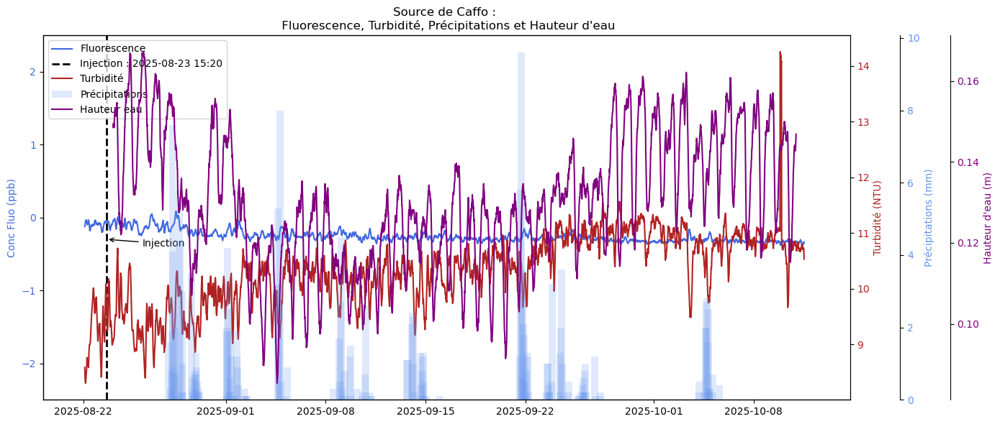

In [43]:

# --- Crop des données sur la période désirée ---
start_date = '2025-08-22'
end_date   = '2025-10-11'

data_caffo_crop = data_caffo.loc[start_date:end_date]
DATA_CLIMAT_h_crop = DATA_CLIMAT_h.loc[start_date:end_date]
data_caffo_resample_crop = data_caffo_resample.loc[start_date:end_date]

# --- Création d'une figure unique ---
fig, ax1 = plt.subplots(figsize=(14, 6))

# Axe principal : Fluorescence
ax1.plot(data_caffo_crop.index, data_caffo_crop['channel1'].rolling(10).mean(),
         color='royalblue', label='Fluorescence')
ax1.set_ylabel('Conc Fluo (ppb)', color='royalblue')
ax1.tick_params(axis='y', labelcolor='royalblue')
ax1.set_ylim(-2.5,2.5)

# Ligne verticale de l’injection
ax1.axvline(
    x=inject_date,
    linestyle='--',
    linewidth=2,
    color='black',
    label=f'Injection : {inject_date:%Y-%m-%d %H:%M}'
)

# Annotation propre
ax1.annotate(
    'Injection',
    xy=(inject_date, -0.3),
    xytext=(datetime(2025, 8, 27, 15, 20), -0.4),
    ha='center',
    arrowprops=dict(arrowstyle='->', color='black')
)

# Axe secondaire : Turbidité
ax2 = ax1.twinx()
ax2.plot(data_caffo_crop.index, data_caffo_crop['channel2'].rolling(10).mean(),
         color='firebrick', label='Turbidité')
ax2.set_ylabel('Turbidité (NTU)', color='firebrick')
ax2.tick_params(axis='y', labelcolor='firebrick')

# Axe tertiaire : Précipitations sous forme de barres
ax3 = ax1.twinx()
ax3.bar(DATA_CLIMAT_h_crop.index, DATA_CLIMAT_h_crop['RR1'], 
        color='cornflowerblue', alpha=0.2, width=0.5, label='Précipitations')
ax3.set_ylabel('Précipitations (mm)', color='cornflowerblue')
ax3.tick_params(axis='y', labelcolor='cornflowerblue')

# Décaler l'axe tertiaire pour qu'il ne chevauche pas ax2
ax3.spines['right'].set_position(('outward', 50))

ax4 = ax1.twinx()
ax4.plot(data_caffo_resample_crop.index,data_caffo_resample_crop['Hauteur_eau'].rolling(10).mean(),
         color='purple', alpha=1, label='Hauteur eau')
ax4.set_ylabel("Hauteur d'eau (m)", color='purple')
ax4.tick_params(axis='y', labelcolor='purple')
ax4.spines['right'].set_position(('outward', 100))

# Fusionner toutes les légendes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines3, labels3 = ax3.get_legend_handles_labels()
lines4, labels4 = ax4.get_legend_handles_labels()

ax1.legend(lines1 + lines2 + lines3 + lines4, labels1 + labels2 + labels3 + labels4, loc='upper left')
# ax1.set_ylim(0.5,2.5)
# Titre et ajustement
plt.title("Source de Caffo : \n Fluorescence, Turbidité, Précipitations et Hauteur d'eau")
plt.xlabel('Date')
plt.tight_layout()
plt.show()

#### Résultats
Les valeurs de fluorescence sont de 0 ppb après la calibration que nous avons réalisée. Le fluocapteur installé à proximité du fluorimètre affiche un résultat positif. La source de Caffo présente un débit constant avec de faibles variations journalières. La turbidité de la source est très faible.

#### Interprétations
Il est difficile de comprendre les résultats obtenus. 
Il n'y a aucun impact des précipitations sur le débit de cette source.

#### Torrent du Retort

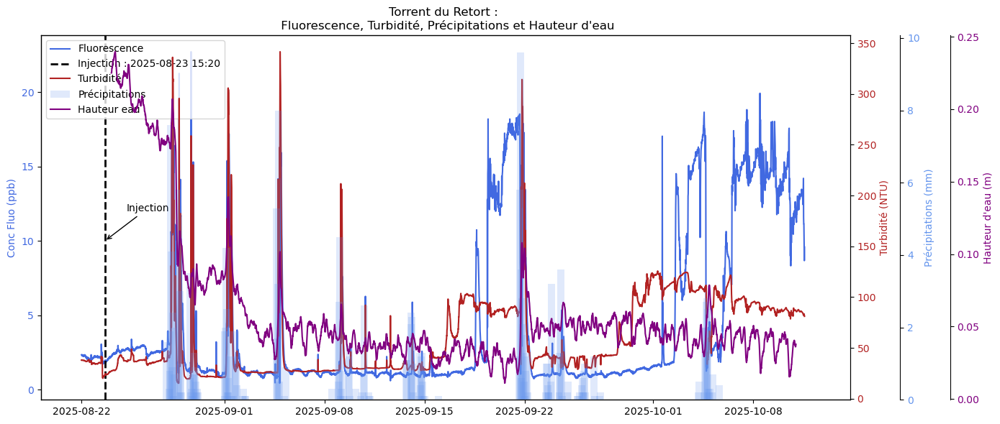

In [44]:

# --- Crop des données sur la période désirée ---
start_date = '2025-08-22'
end_date   = '2025-10-11'

data_retord_crop = data_retord.loc[start_date:end_date]
DATA_CLIMAT_h_crop = DATA_CLIMAT_h.loc[start_date:end_date]
data_retort_resample_crop = data_retort_resample.loc[start_date:end_date]

# --- Création d'une figure unique ---
fig, ax1 = plt.subplots(figsize=(14, 6))

# Axe principal : Fluorescence
ax1.plot(data_retord_crop.index, data_retord_crop['channel1'].rolling(1).mean(),
         color='royalblue', label='Fluorescence')
ax1.set_ylabel('Conc Fluo (ppb)', color='royalblue')
ax1.tick_params(axis='y', labelcolor='royalblue')

# Ligne verticale de l’injection
ax1.axvline(
    x=inject_date,
    linestyle='--',
    linewidth=2,
    color='black',
    label=f'Injection : {inject_date:%Y-%m-%d %H:%M}'
)

# Annotation propre
ax1.annotate(
    'Injection',
    xy=(inject_date, 10),
    xytext=(datetime(2025, 8, 26, 15, 20), 12),
    ha='center',
    arrowprops=dict(arrowstyle='->', color='black')
)

# Axe secondaire : Turbidité
ax2 = ax1.twinx()
ax2.plot(data_retord_crop.index, data_retord_crop['channel2'].rolling(1).mean(),
         color='firebrick', label='Turbidité')
ax2.set_ylabel('Turbidité (NTU)', color='firebrick')
ax2.tick_params(axis='y', labelcolor='firebrick')

# Axe tertiaire : Précipitations sous forme de barres
ax3 = ax1.twinx()
ax3.bar(DATA_CLIMAT_h_crop.index, DATA_CLIMAT_h_crop['RR1'], 
        color='cornflowerblue', alpha=0.2, width=0.5, label='Précipitations')
ax3.set_ylabel('Précipitations (mm)', color='cornflowerblue')
ax3.tick_params(axis='y', labelcolor='cornflowerblue')

# Décaler l'axe tertiaire pour qu'il ne chevauche pas ax2
ax3.spines['right'].set_position(('outward', 50))

ax4 = ax1.twinx()
ax4.plot(data_retort_resample_crop.index,data_retort_resample_crop['Hauteur_eau'].rolling(10).mean(),
         color='purple', alpha=1, label='Hauteur eau')
ax4.set_ylabel("Hauteur d'eau (m)", color='purple')
ax4.tick_params(axis='y', labelcolor='purple')
ax4.spines['right'].set_position(('outward', 100))

# Fusionner toutes les légendes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines3, labels3 = ax3.get_legend_handles_labels()
lines4, labels4 = ax4.get_legend_handles_labels()

ax1.legend(lines1 + lines2 + lines3 + lines4, labels1 + labels2 + labels3 + labels4, loc='upper left')
# ax1.set_ylim(0.5,2.5)
# Titre et ajustement
plt.title("Torrent du Retort : \n Fluorescence, Turbidité, Précipitations et Hauteur d'eau")
plt.xlabel('Date')
plt.tight_layout()
plt.show()

#### Résultats
Les valeurs de fluorescence varient de 1 à 15 ppb après calibration. Ces valeurs sont faibles compte tenu d'une possible sortie du traceur à 2 km de son point d'injection.

Nous observons trois types de variations de la fluorescence :
- des pics de fluorescence et de turbidité concomitants à des précipitations, et ce même avant l'injection du traceur.
- À partir de mi-septembre, nous observons des périodes de plusieurs jours durant lesquelles les valeurs de fluorescence et de turbidité sont élevées. Ces pics disparaissent après des précipitations. Nous identifions trois périodes correspondant à ces variations : du 17 au 22 septembre, du 2 au 5 octobre et du 8 octobre jusqu'à la fin de la mesure.
- Nous observons également un signal journalier de la fluorescence, mais pas de variation de la turbidité selon ce cycle. Ce phénomène est principalement observable entre début septembre et début octobre. Ce signal est cyclique, avec un minimum vers 13 h et un maximum vers 1 h.


##### Interprétations

Nous estimons que les pics de fluorescence observés proviennent de la fluorescence naturelle liée à la mobilisation de la matière organique lors des pluies, ce qui explique l'augmentation de la turbidité au même moment et l'absence de courbe de décroissance.

Les périodes de fluorescence longue que nous avons observées pourraient provenir d'une obstruction du capteur par des sédiments. Lors de la récupération du fluorimètre, celui-ci était sale (cf. photo). Le fait que ces périodes se terminent par des précipitations, sauf pour la dernière, nous fait pencher pour cette hypothèse.

Nous avons émis plusieurs hypothèses pour expliquer ces cycles journaliers observés :
- l'impact de la lumière ambiante, bien que le capteur ait été mis en place dans un tube en plastique noir légèrement perforé (cf. photo).
- cycle de respiration de la végétation et de la zone humide dans laquelle l'eau résurge.

Nous penchons plutôt pour la seconde hypothèse, car les variations sont faibles et régulières. Nous avons surtout des arguments contre la première. Un effet du soleil et de la lumière extérieure ne serait visible que pendant la journée, ce qui impliquerait une fluorescence constante la nuit. Nous sommes preneurs d'autres hypothèses pour expliquer cela. Bien que cet effet semble n'avoir aucun rapport avec le traçage.

### Caractérisation hydraulique du système karstique


### <a id='toc1_6_1_'></a>[Température](#toc0_)

Représentation de l'ensemble des données de température disponible durant la période de l'étude.

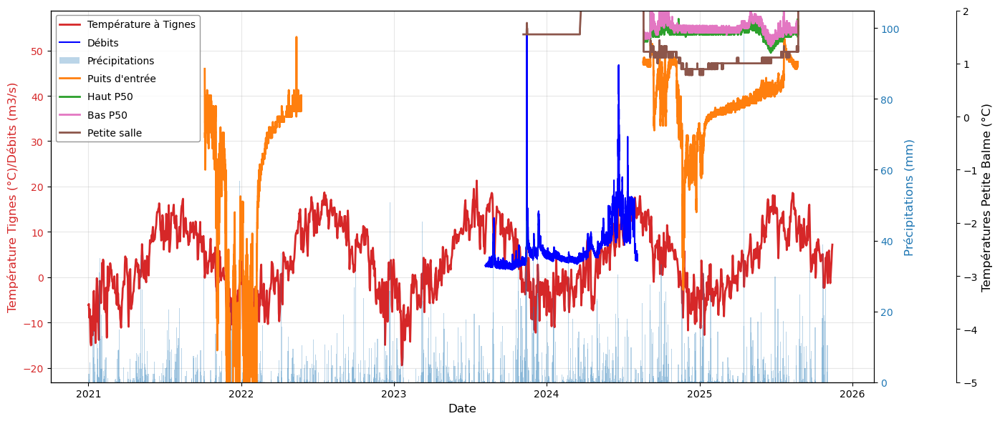

In [69]:
fig, ax = plt.subplots(figsize=(14, 6))

# --- Température à Tignes ---
ax.plot(DATA_CLIMAT.index, DATA_CLIMAT['TM'], label='Température à Tignes', color="tab:red", linewidth=2)
ax.plot(data_debit.index,data_debit['Valeur (en l/s)']/1000,color="Blue",label='Débits')
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Température Tignes (°C)/Débits (m3/s)', color="tab:red", fontsize=12)
ax.tick_params(axis='y', labelcolor="tab:red")
ax.grid(True, alpha=0.3)

# --- Précipitations sur axe Y droit ---
ax2 = ax.twinx()
ax2.bar(DATA_CLIMAT.index, DATA_CLIMAT['RR'], label="Précipitations", color="tab:blue", alpha=0.3, width=2)
ax2.set_ylabel("Précipitations (mm)", color="tab:blue", fontsize=12)
ax2.tick_params(axis='y', labelcolor="tab:blue")

# --- Autres températures sur un troisième axe Y ---
ax3 = ax.twinx()
ax3.spines["right"].set_position(("axes", 1.1))  # Décale le 3e axe Y
ax3.plot(data_temp_MT1.index, data_temp_MT1['Temp'], label="Puits d'entrée", color="tab:orange", linewidth=2)
# ax3.plot(data_temp_MT2.index, data_temp_MT2['Temp'], label="Jonction branche sud", color="tab:cyan", linewidth=2)
ax3.plot(data_temp_MT3.index, data_temp_MT3['Temp'], label="Haut P50", color="tab:green", linewidth=2)
ax3.plot(data_temp_MT4.index, data_temp_MT4['Temp'], label="Bas P50", color="tab:pink", linewidth=2)
ax3.plot(data_temp_MT6.index, data_temp_MT6['Temp'], label="Petite salle", color="tab:brown", linewidth=2)
ax3.set_ylabel("Températures Petite Balme (°C)", fontsize=12)
ax3.set_ylim([-5,2])

# --- Fusion des légendes ---
h1, l1 = ax.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
h3, l3 = ax3.get_legend_handles_labels()
ax.legend(h1 + h2 + h3, l1 + l2 + l3, loc="upper left", fontsize=10,
          frameon=True, fancybox=True, facecolor="white", edgecolor="gray", labelspacing=0.8)

plt.tight_layout()
plt.show()


#### Figure de l'évolution de la température dans le puits d'entrée

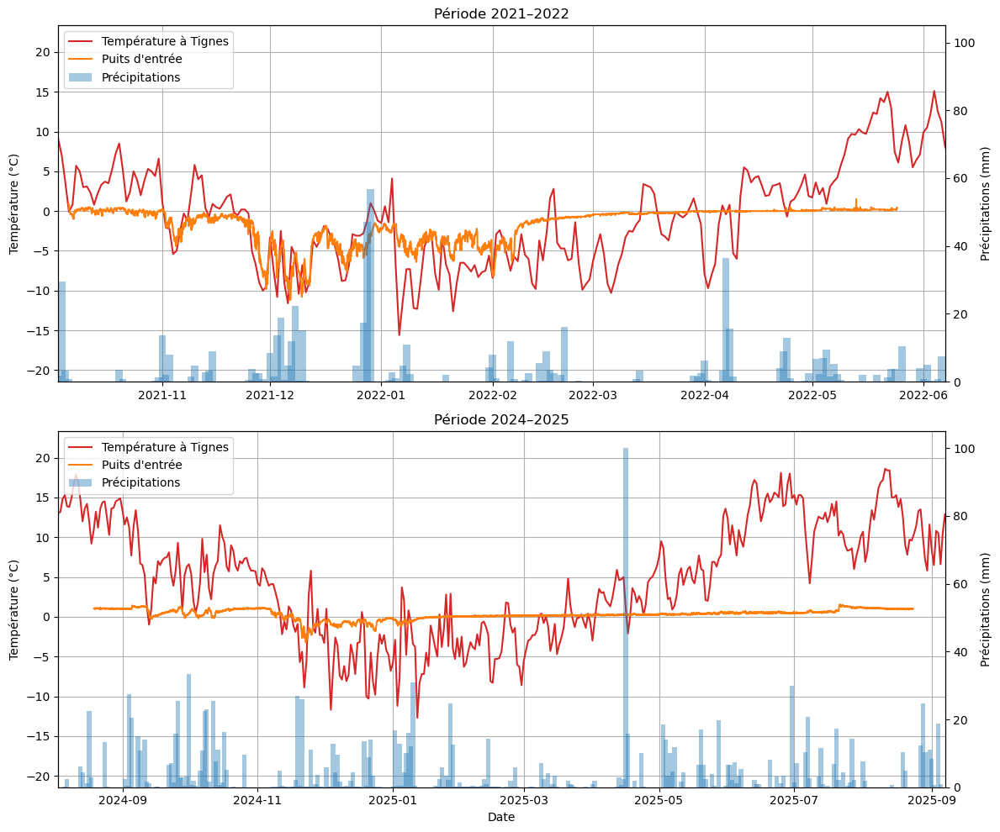

In [46]:
fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=False)

# --- Premier subplot (2021–2022) ---
axes[0].plot(DATA_CLIMAT.index, DATA_CLIMAT['TM'], label='Température à Tignes', color="tab:red")
axes[0].plot(data_temp_MT1.index, data_temp_MT1['Temp'], label="Puits d'entrée", color="tab:orange")

axes[0].set_ylabel('Température (°C)')
axes[0].set_xlim(date(2021, 10, 3), date(2022, 6, 7))
axes[0].grid(True)
axes[0].set_title("Période 2021–2022")

# ➤ Axe secondaire précipitations
ax2_0 = axes[0].twinx()
ax2_0.bar(DATA_CLIMAT.index, DATA_CLIMAT['RR'], label="Précipitations", 
          color="tab:blue", alpha=0.4, width=2)
ax2_0.set_ylabel("Précipitations (mm)")

# ➤ Fusion des légendes
h1, l1 = axes[0].get_legend_handles_labels()
h2, l2 = ax2_0.get_legend_handles_labels()
axes[0].legend(h1 + h2, l1 + l2, loc="upper left")

# --- Deuxième subplot (2024–2025) ---
axes[1].plot(DATA_CLIMAT.index, DATA_CLIMAT['TM'], label='Température à Tignes', color="tab:red")
axes[1].plot(data_temp_MT1.index, data_temp_MT1['Temp'], label="Puits d'entrée", color="tab:orange")

axes[1].set_xlabel('Date')
axes[1].set_ylabel('Température (°C)')
axes[1].set_xlim(date(2024, 8, 3), date(2025, 9, 7))
axes[1].grid(True)
axes[1].set_title("Période 2024–2025")

# ➤ Axe secondaire précipitations
ax2_1 = axes[1].twinx()
ax2_1.bar(DATA_CLIMAT.index, DATA_CLIMAT['RR'], label="Précipitations", 
          color="tab:blue", alpha=0.4, width=2)
ax2_1.set_ylabel("Précipitations (mm)")

# ➤ Fusion des légendes
h1, l1 = axes[1].get_legend_handles_labels()
h2, l2 = ax2_1.get_legend_handles_labels()
axes[1].legend(h1 + h2, l1 + l2, loc="upper left")

# Ajustement
plt.tight_layout()
plt.show()

#### Figure de l'évolution de la température dans le P50

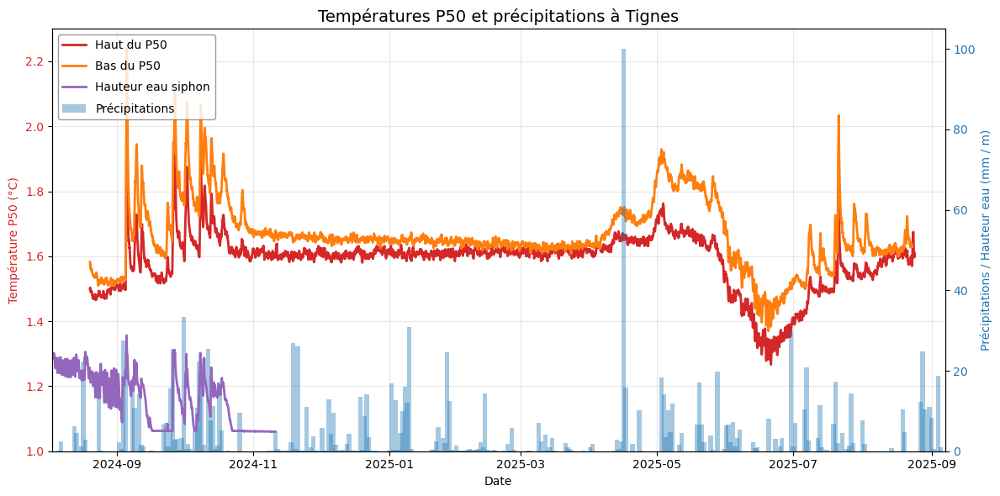

In [70]:
fig, ax_tignes = plt.subplots(figsize=(12, 6))

# --- Température P50 (MT3/MT4) sur axe Y gauche ---
ax_p50 = ax_tignes
ax_p50.plot(data_temp_MT3.index, data_temp_MT3['Temp'].rolling(window=12, center=True).mean(), label='Haut du P50', color="tab:red", linewidth=2)
ax_p50.plot(data_temp_MT4.index, data_temp_MT4['Temp'].rolling(window=12, center=True).mean(), label='Bas du P50', color="tab:orange", linewidth=2)
ax_p50.set_ylabel('Température P50 (°C)', color="tab:red")
ax_p50.tick_params(axis='y', labelcolor="tab:red")
ax_p50.grid(True, alpha=0.3)
ax_p50.set_ylim([1,2.3])

# --- Précipitations sur axe Y droit ---
ax_precip = ax_tignes.twinx()
ax_precip.bar(DATA_CLIMAT.index, DATA_CLIMAT['RR'], label='Précipitations', 
              color='tab:blue', alpha=0.4, width=2)
ax_precip.plot(data_siphon_resample.index, data_siphon_resample['Hauteur_eau_siphon'], 
               label='Hauteur eau siphon', color="tab:purple", linewidth=2)
ax_precip.set_ylabel('Précipitations / Hauteur eau (mm / m)', color="tab:blue")
ax_precip.tick_params(axis='y', labelcolor="tab:blue")

# --- Axe X et titre ---
ax_tignes.set_xlabel('Date')
ax_tignes.set_xlim(date(2024, 8, 3), date(2025, 9, 7))
ax_tignes.set_title('Températures P50 et précipitations à Tignes', fontsize=14)

# --- Fusion des légendes ---
h1, l1 = ax_p50.get_legend_handles_labels()
h2, l2 = ax_precip.get_legend_handles_labels()
ax_tignes.legend(h1 + h2, l1 + l2, loc="upper left",
                 fontsize=10, frameon=True, fancybox=True,
                 facecolor="white", edgecolor="gray", labelspacing=0.8)

plt.tight_layout()
plt.show()



### <a id='toc1_6_2_'></a>[Hauteur d'eau et température](#toc0_)

Nous recherchons une corrélation entre les mise en charge et la température. L'eau apporte de la chaleur dans la cavité en été mais à la période de fonte elle semble apporter du froid.

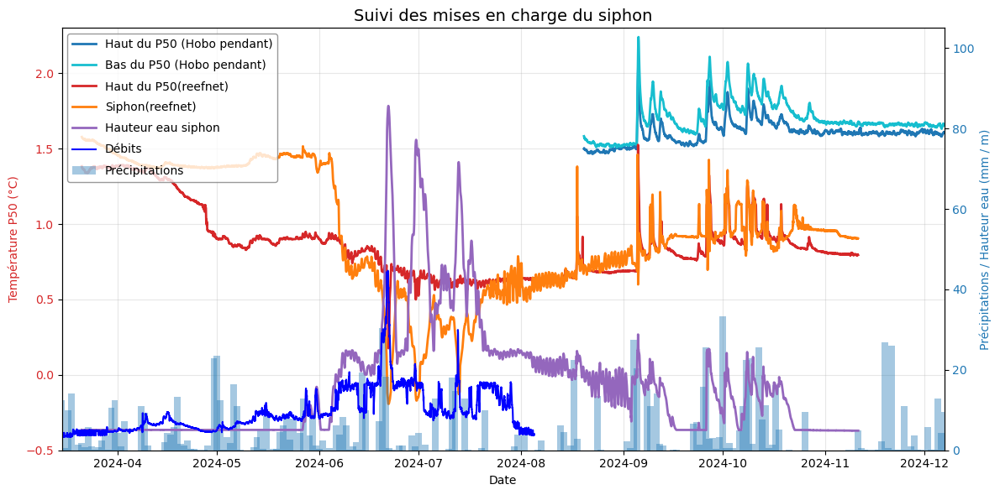

In [71]:
fig, ax_tignes = plt.subplots(figsize=(12, 6))

# --- Température P50 (MT3/MT4) sur axe Y gauche ---
ax_p50 = ax_tignes
ax_p50.plot(data_temp_MT3.index, data_temp_MT3['Temp'].rolling(window=12, center=True).mean(), label='Haut du P50 (Hobo pendant)', color="tab:blue", linewidth=2)
ax_p50.plot(data_temp_MT4.index, data_temp_MT4['Temp'].rolling(window=12, center=True).mean(), label='Bas du P50 (Hobo pendant)', color="tab:cyan", linewidth=2)
ax_p50.plot(data_siphon_resample.index, data_siphon_resample['Temp_P50'].rolling(window=12, center=True).mean(), label='Haut du P50(reefnet)', color="tab:red", linewidth=2)
ax_p50.plot(data_siphon_resample.index, data_siphon_resample['Temp_siphon'].rolling(window=12, center=True).mean(), label='Siphon(reefnet)', color="tab:orange", linewidth=2)
ax_p50.set_ylabel('Température P50 (°C)', color="tab:red")
ax_p50.tick_params(axis='y', labelcolor="tab:red")
ax_p50.grid(True, alpha=0.3)
ax_p50.set_ylim([-0.5,2.3])

# --- Précipitations sur axe Y droit ---
ax_precip = ax_tignes.twinx()
ax_precip.bar(DATA_CLIMAT.index, DATA_CLIMAT['RR'], label='Précipitations', 
              color='tab:blue', alpha=0.4, width=2)
ax_precip.plot(data_siphon_resample.index, data_siphon_resample['Hauteur_eau_siphon'], 
               label='Hauteur eau siphon', color="tab:purple", linewidth=2)
ax_precip.set_ylabel('Précipitations / Hauteur eau (mm / m)', color="tab:blue")
ax_precip.tick_params(axis='y', labelcolor="tab:blue")
ax_precip.plot(data_debit.index,data_debit['Valeur (en l/s)'].rolling(window=12, center=True).mean()/1000,color="Blue",label='Débits')

# --- Axe X et titre ---
ax_tignes.set_xlabel('Date')
ax_tignes.set_xlim(date(2024, 3, 15), date(2024, 12, 7))
ax_tignes.set_title('Suivi des mises en charge du siphon', fontsize=14)

# --- Fusion des légendes ---
h1, l1 = ax_p50.get_legend_handles_labels()
h2, l2 = ax_precip.get_legend_handles_labels()
ax_tignes.legend(h1 + h2, l1 + l2, loc="upper left",
                 fontsize=10, frameon=True, fancybox=True,
                 facecolor="white", edgecolor="gray", labelspacing=0.8)

plt.tight_layout()
plt.show()


## Annexe



### Régression linaire sur les phases de charges identifiées

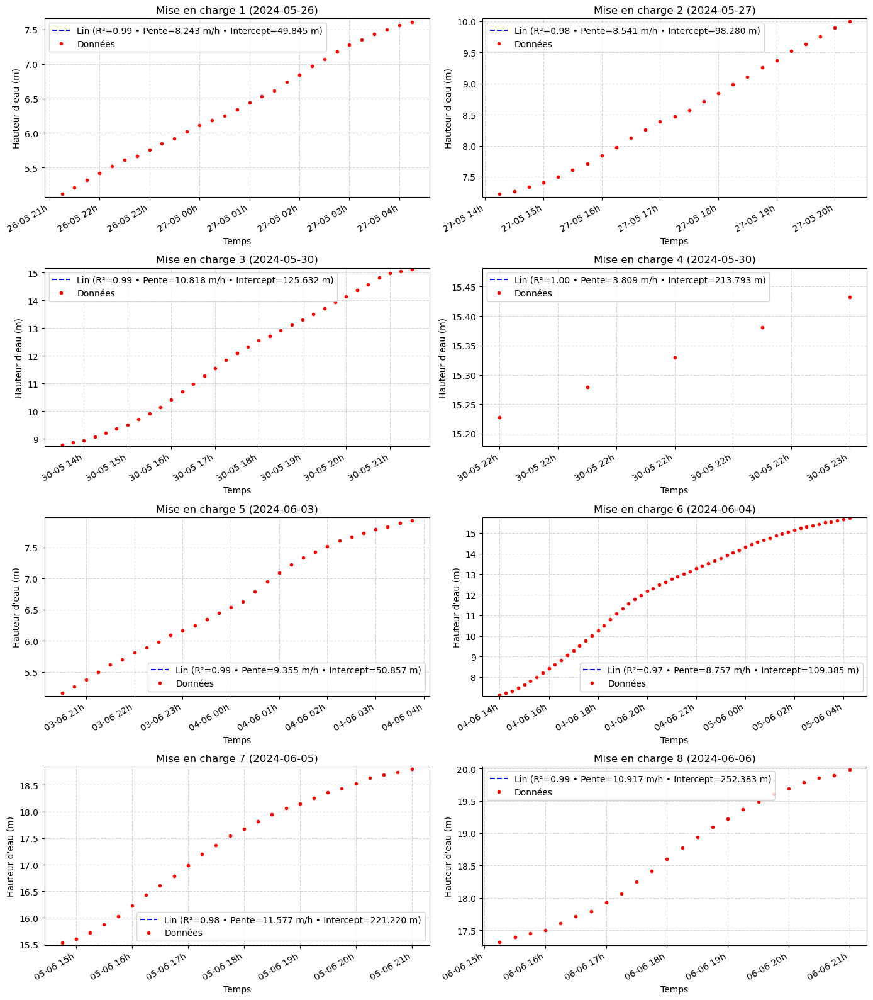

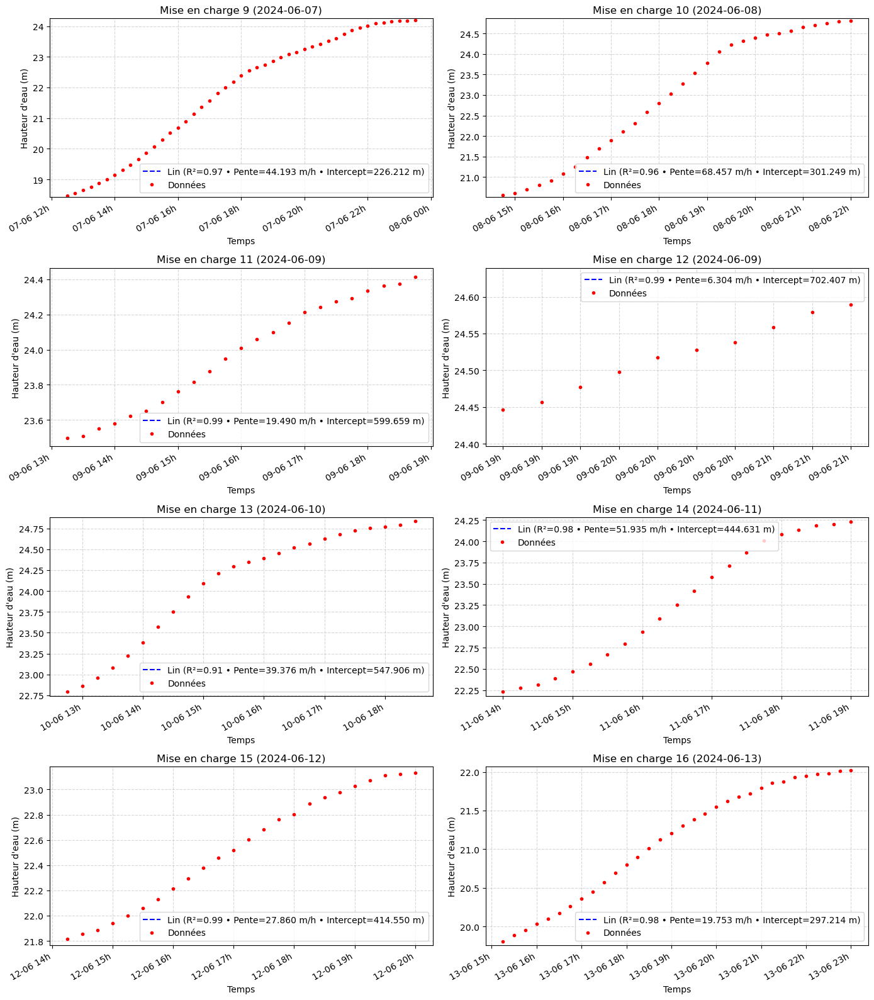

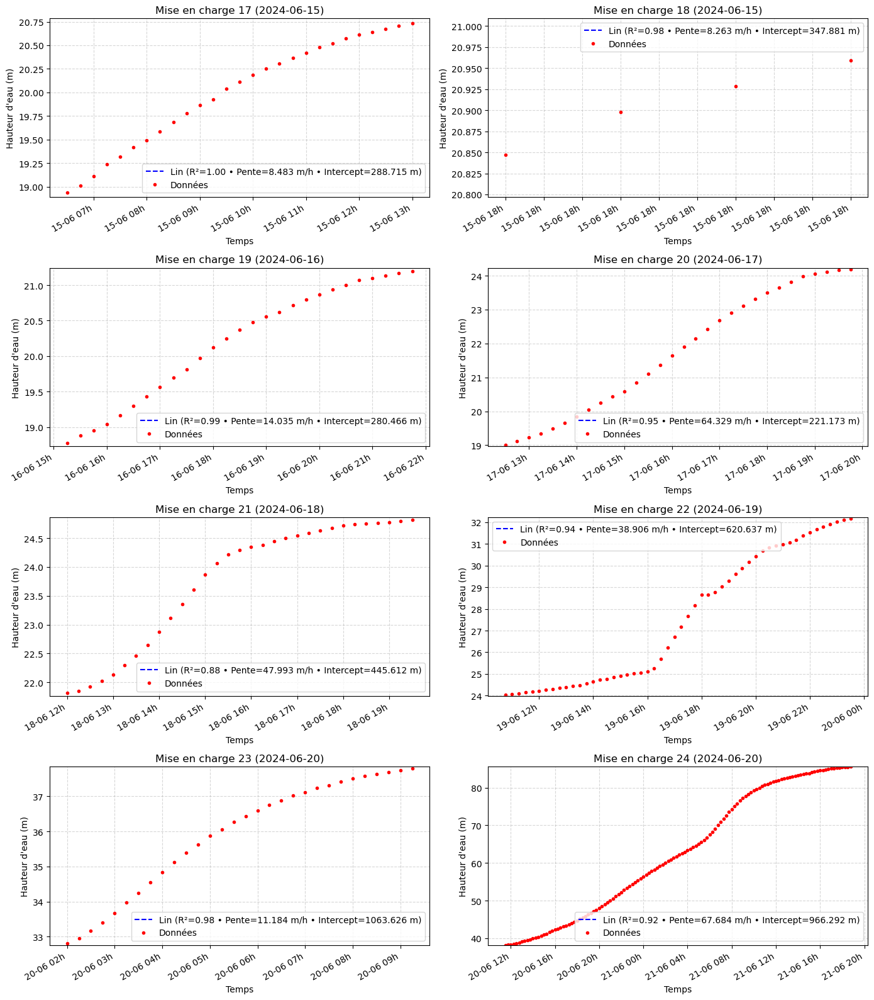

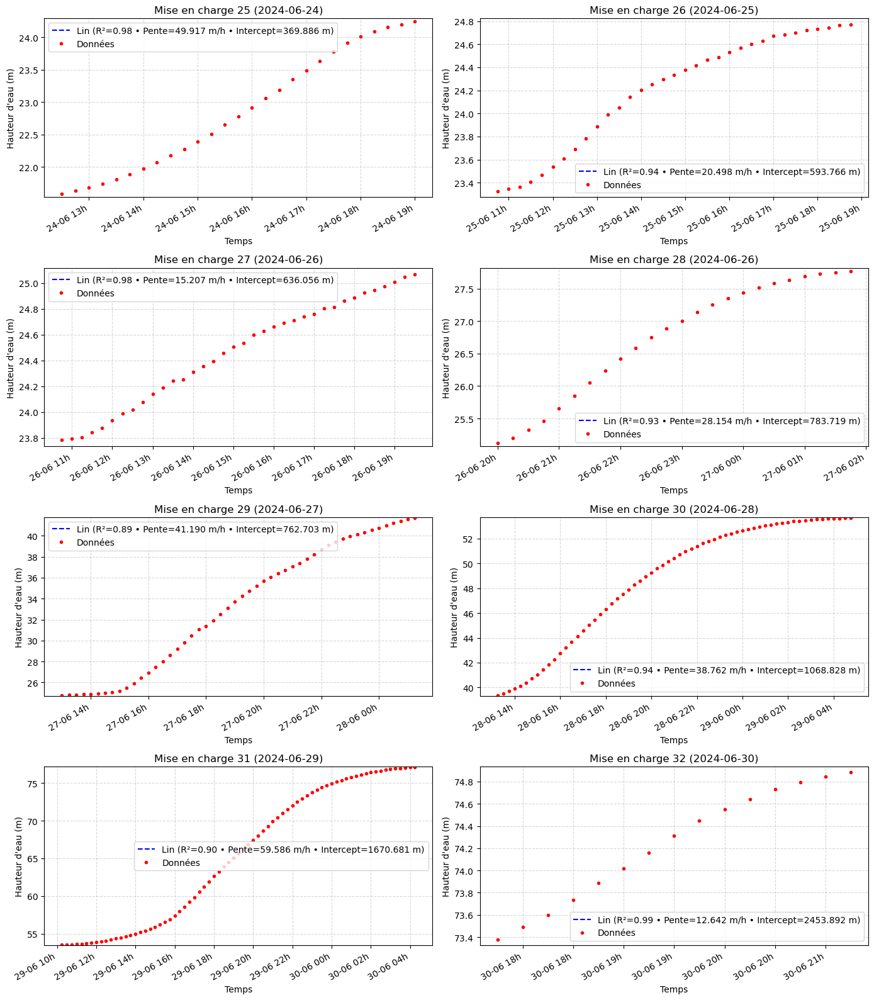

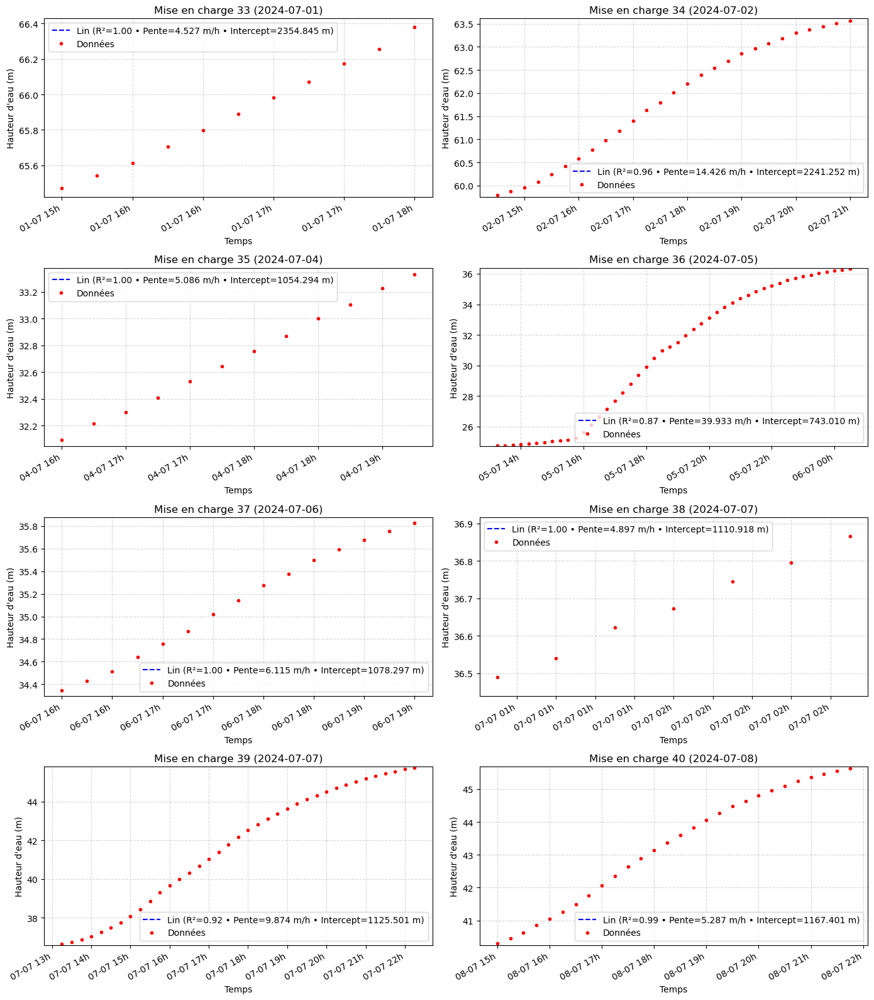

...

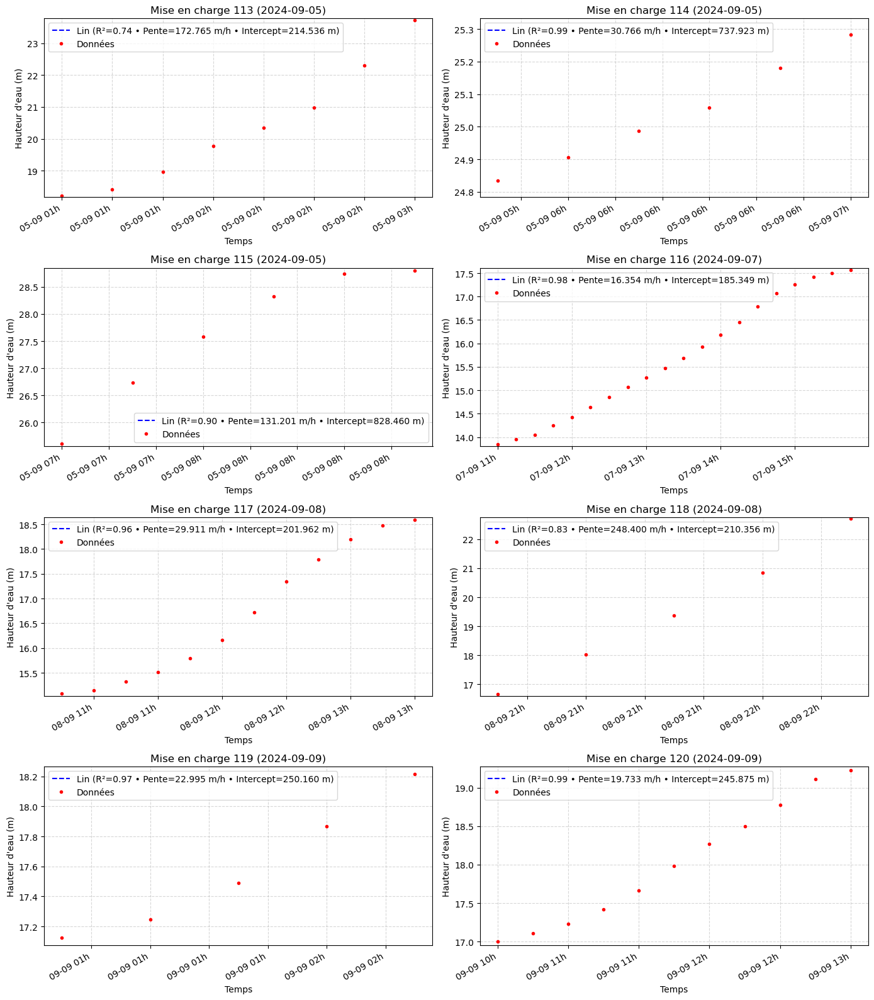

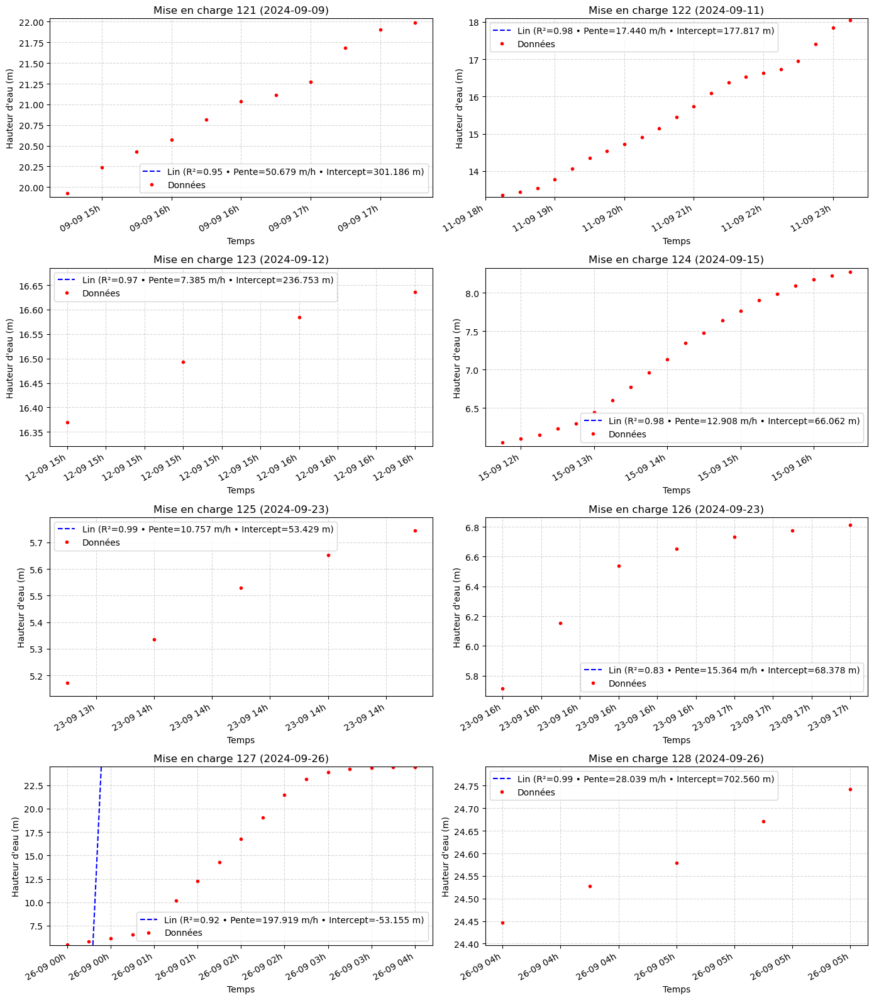

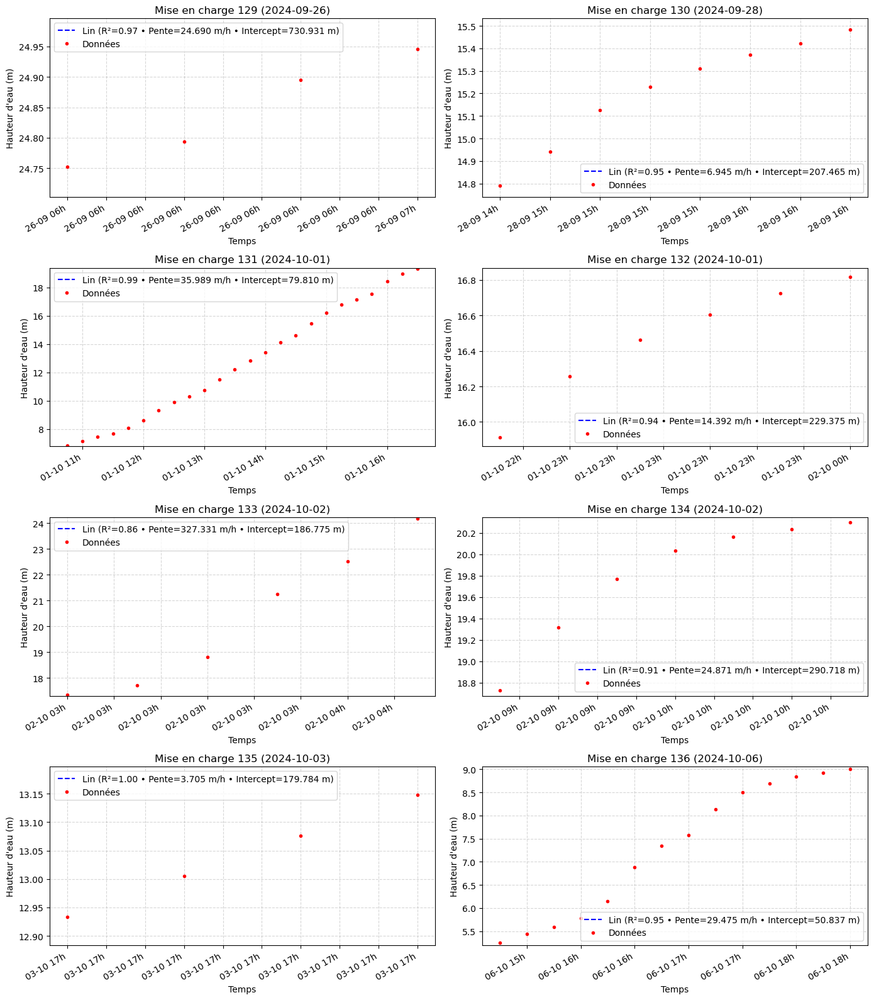

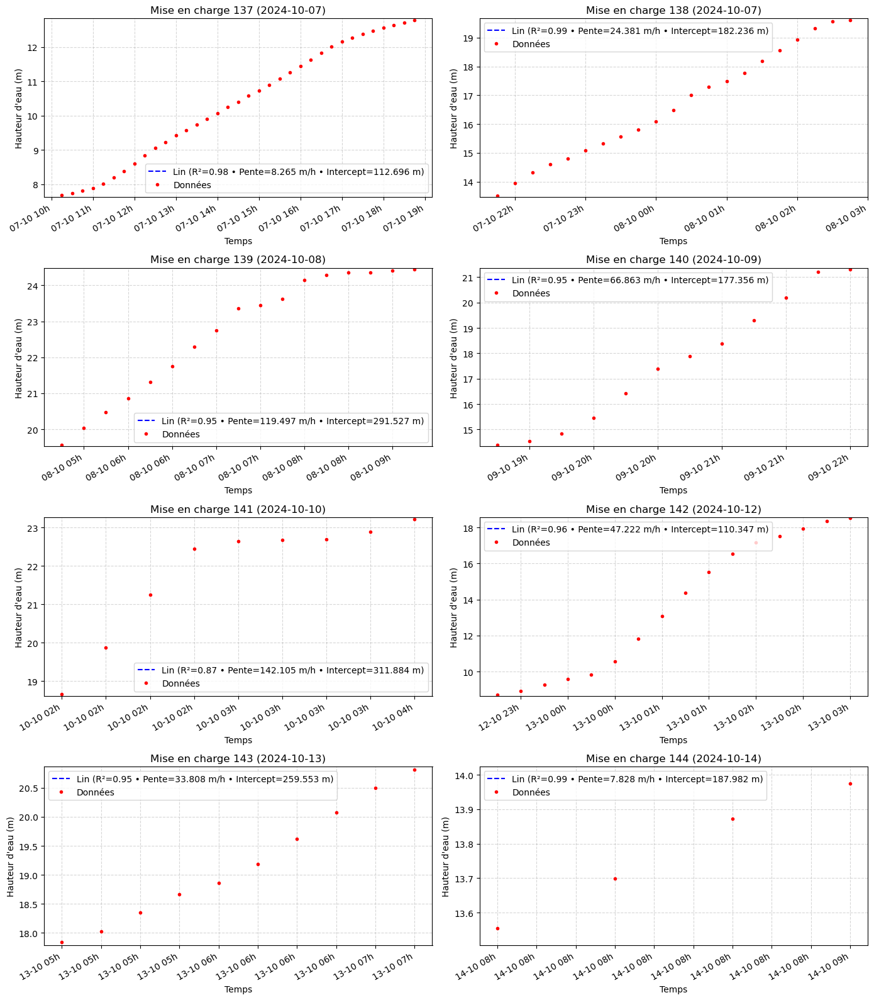

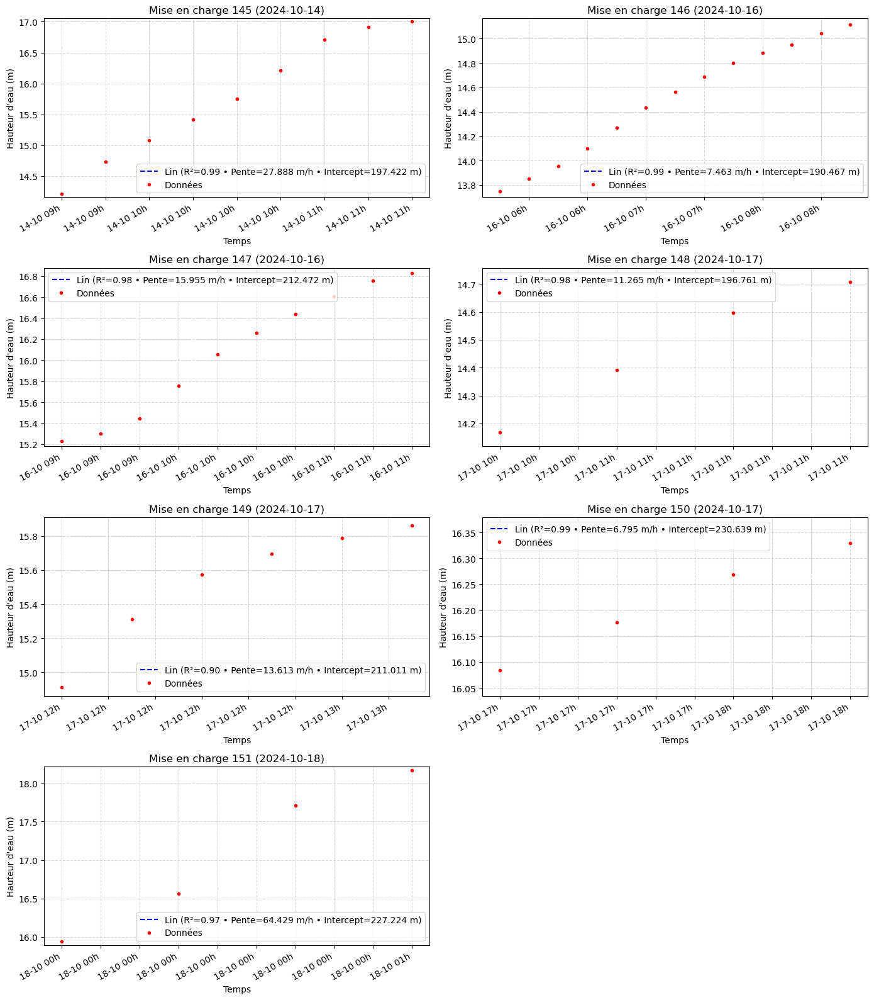

In [49]:
n = len(episodes_charge)

if n == 0:
    print("Aucun épisode de charge trouvé.")
else:
    n_per_page = 8   # ⬅️ changer à 6 si tu veux 6 par page
    ncols = 2
    nrows = math.ceil(n_per_page / ncols)

    for page_start in range(0, n, n_per_page):
        page_end = min(page_start + n_per_page, n)
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 4 * nrows))
        axes = axes.flatten()

        for i, (idx, row) in enumerate(episodes_charge.iloc[page_start:page_end].iterrows()):
            ax = axes[i]

            # Sous-dataframe
            sdf = df.loc[row["t_start"]:row["t_end"]]
            t = (sdf.index - sdf.index[0]).total_seconds() / 3600.0
            h = sdf["Hauteur_eau_siphon"].values

            # Fit exponentiel
            tau_exp = row.get("tau_h", np.nan)
            h_inf_exp = row.get("h_inf_estime", np.nan)
            if not np.isnan(tau_exp):
                h_model_exp = h_inf_exp + (h[0] - h_inf_exp) * np.exp(-t / tau_exp)
                ax.plot(sdf.index, h_model_exp, "--", color="black",
                        label=f"Exp (τ={tau_exp:.1f} h, R²={row.get('R2', np.nan):.2f})")

            # Fit linéaire
            slope = row.get("slope", np.nan)
            intercept = row.get("intercept", np.nan)
            r2_lin = row.get("R2_lin", np.nan)
            if not np.isnan(slope) and not np.isnan(intercept):
                h_model_lin = slope * t + intercept
                ax.plot(sdf.index, h_model_lin, "--", color="blue",
                        label=f"Lin (R²={r2_lin:.2f} • Pente={slope:.3f} m/h • Intercept={intercept:.3f} m)")

            # Données réelles
            ax.plot(sdf.index, h, "o", ms=3, color="red", label="Données")

            # Mise en forme
            ax.set_title(f"Mise en charge {page_start+i+1} ({row['t_start'].strftime('%Y-%m-%d')})")
            ax.set_xlabel("Temps")
            ax.set_ylabel("Hauteur d'eau (m)")
            ax.grid(True, linestyle="--", alpha=0.5)
            ax.legend()
            ax.set_ylim(h.min() - 0.05, h.max() + 0.05)

            ax.xaxis.set_major_formatter(mdates.DateFormatter("%d-%m %Hh"))  # Format jour-heure
            ax.xaxis.set_major_locator(mdates.AutoDateLocator())             # Placement auto
            plt.setp(ax.get_xticklabels(), rotation=30, ha="right")          # Rotation 30° lisible


        # Supprimer axes vides
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()
        # plt.savefig(f"mises_en_charge_page_{page_start//n_per_page+1}.pdf")  # ⬅️ si tu veux sauvegarder


### Régression linaire sur les phases de vidanges identifiées

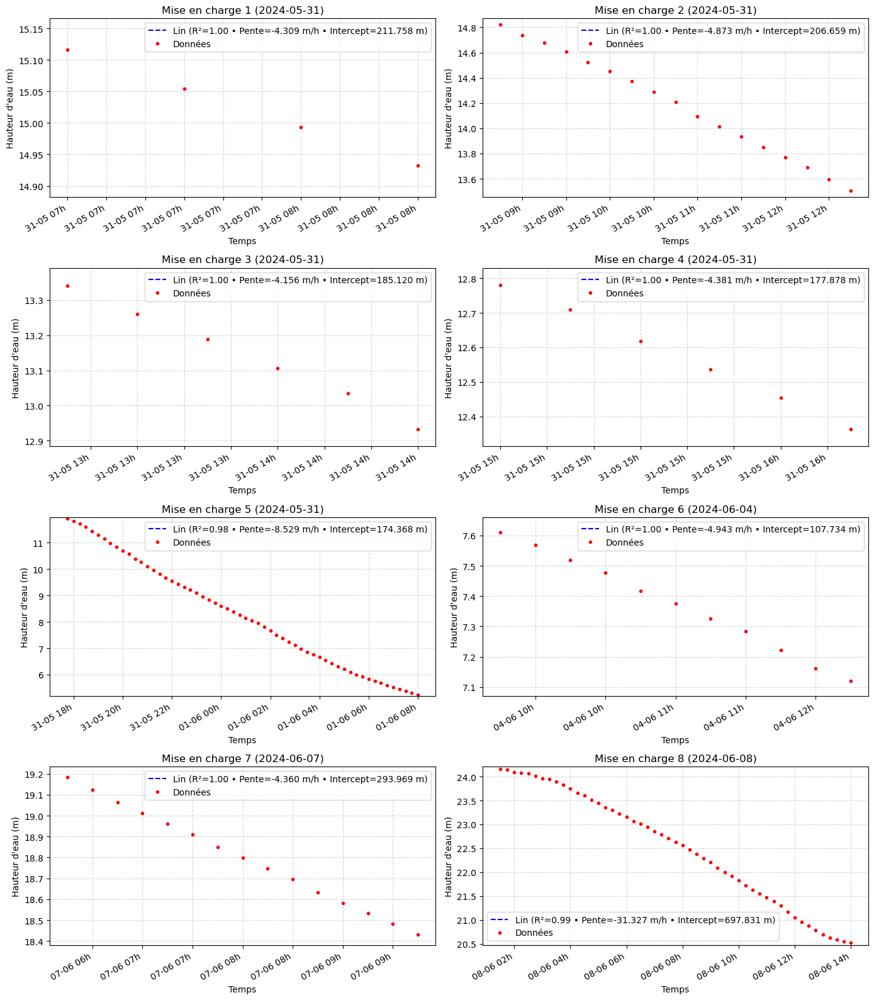

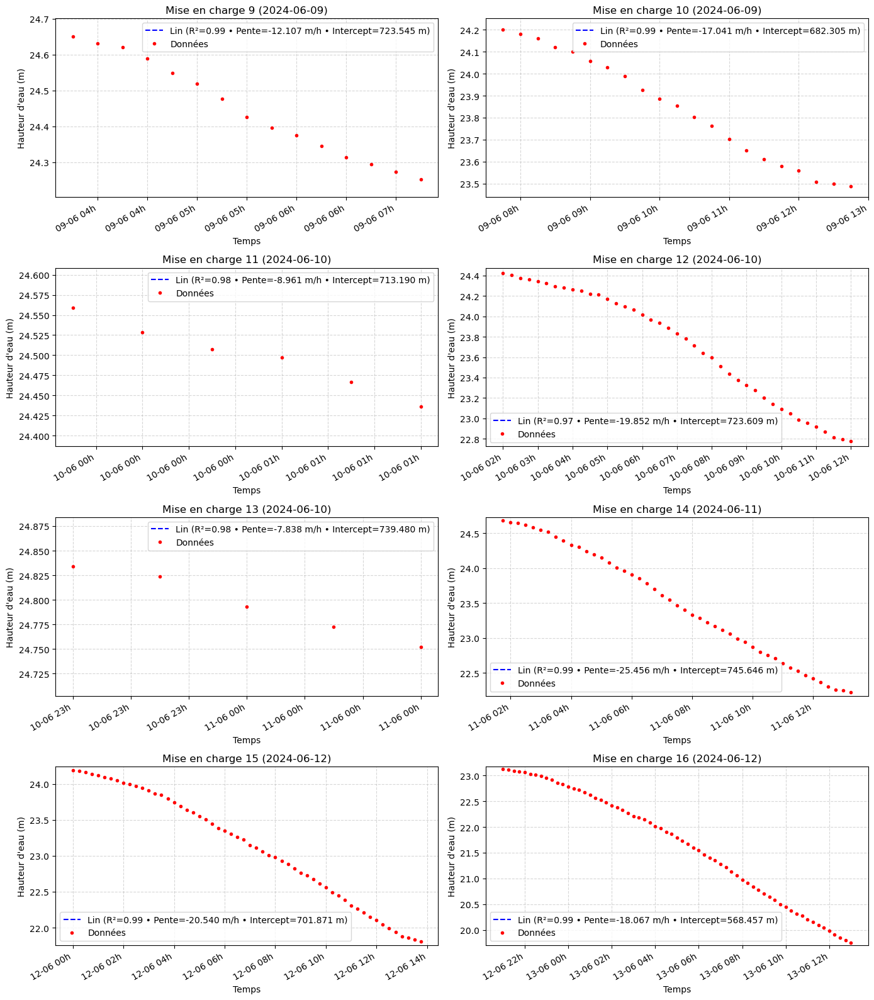

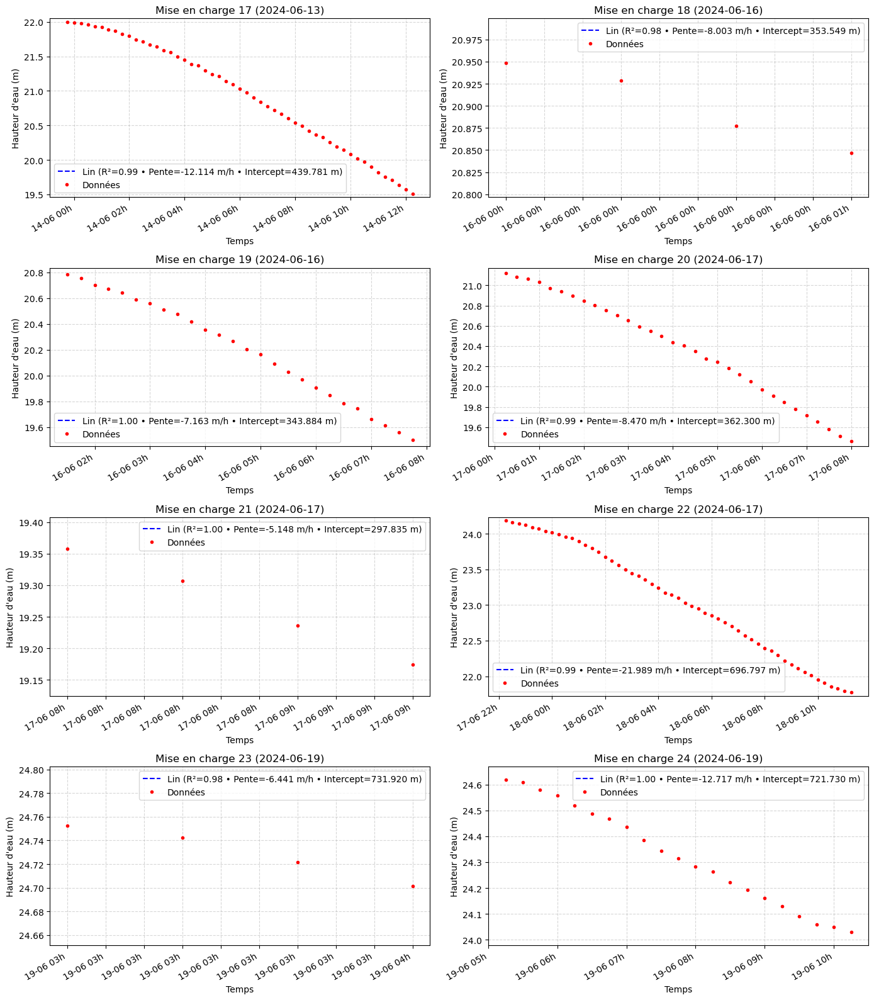

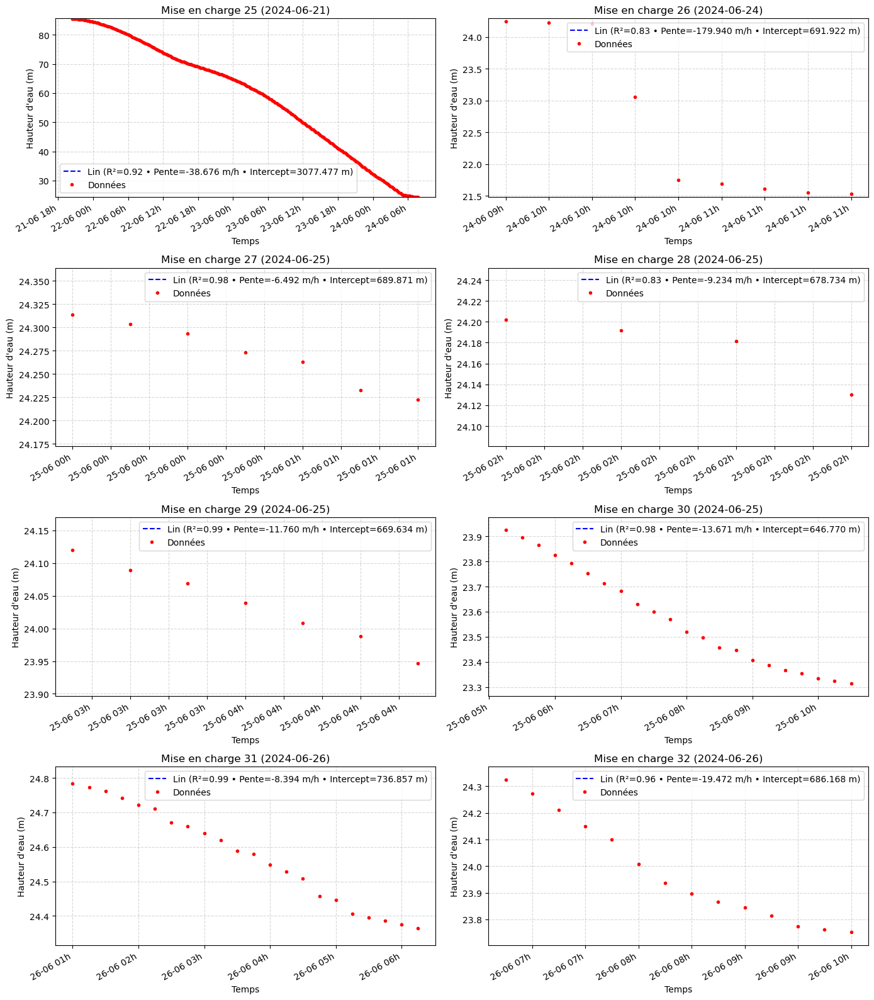

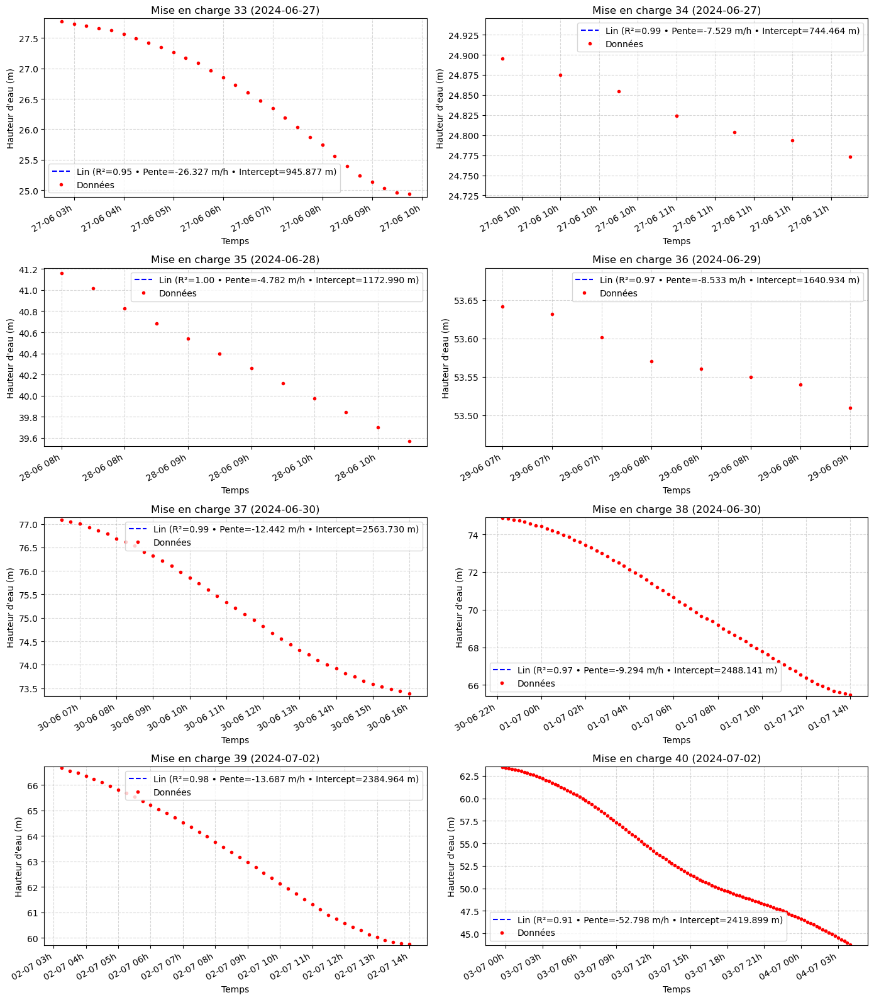

...

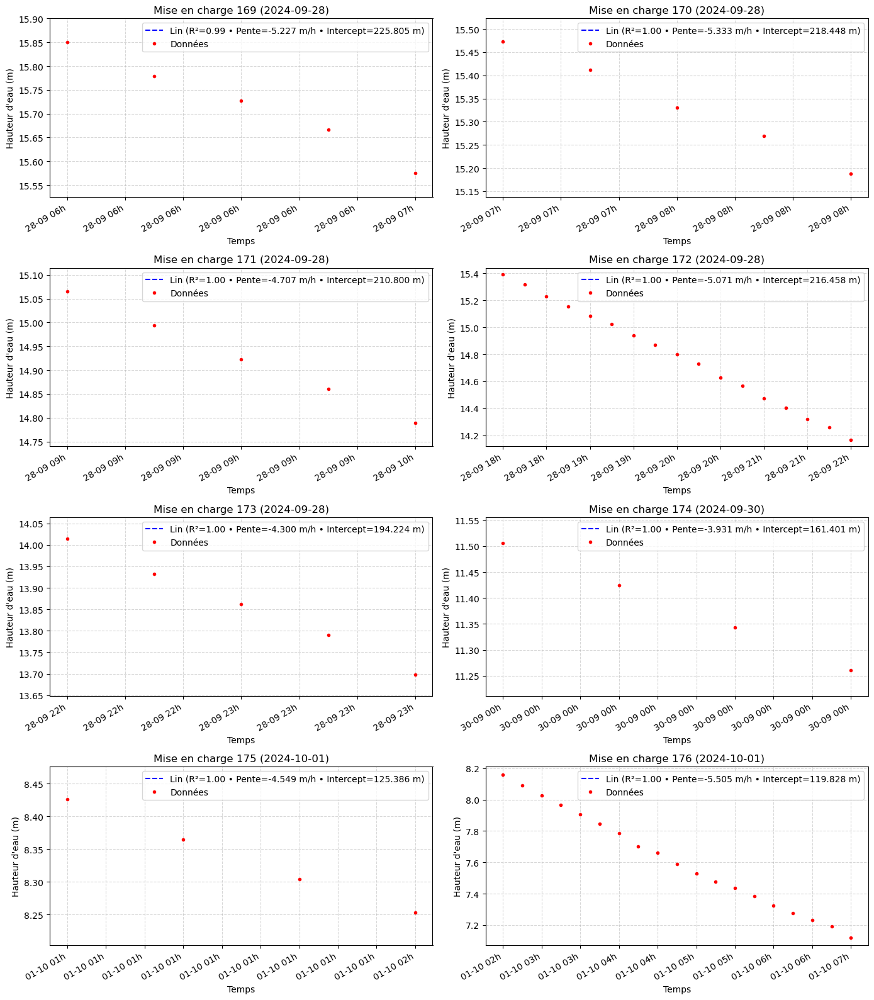

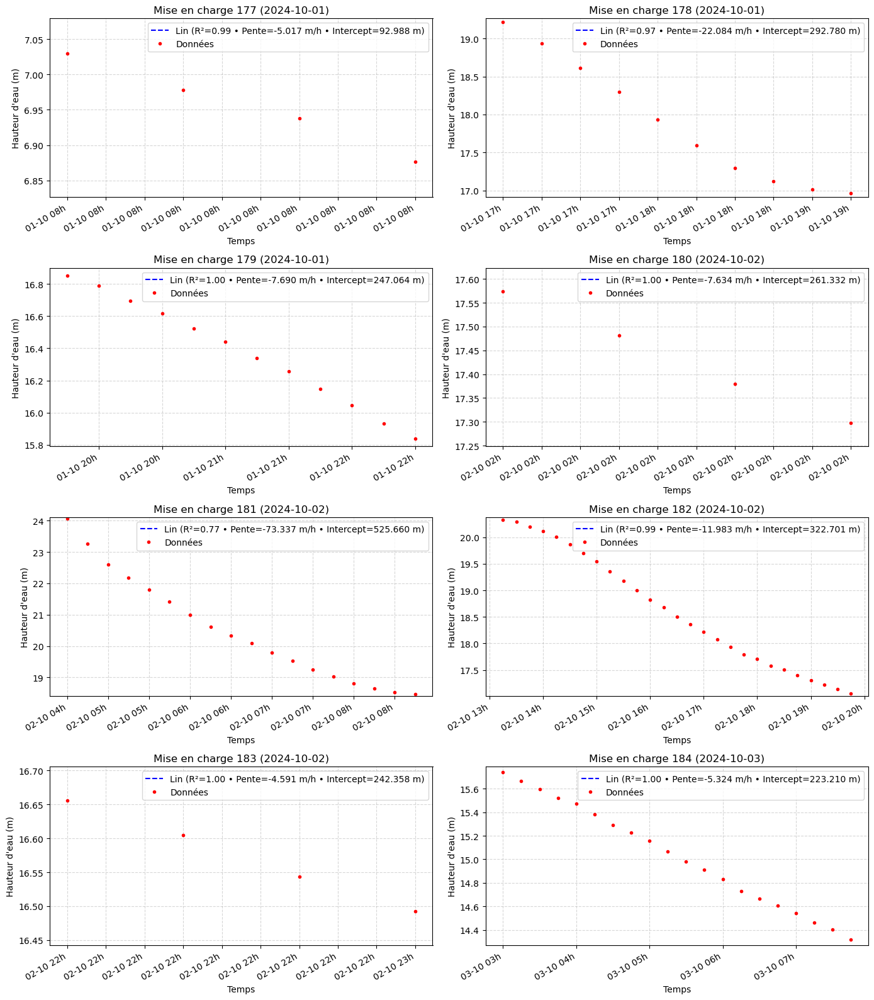

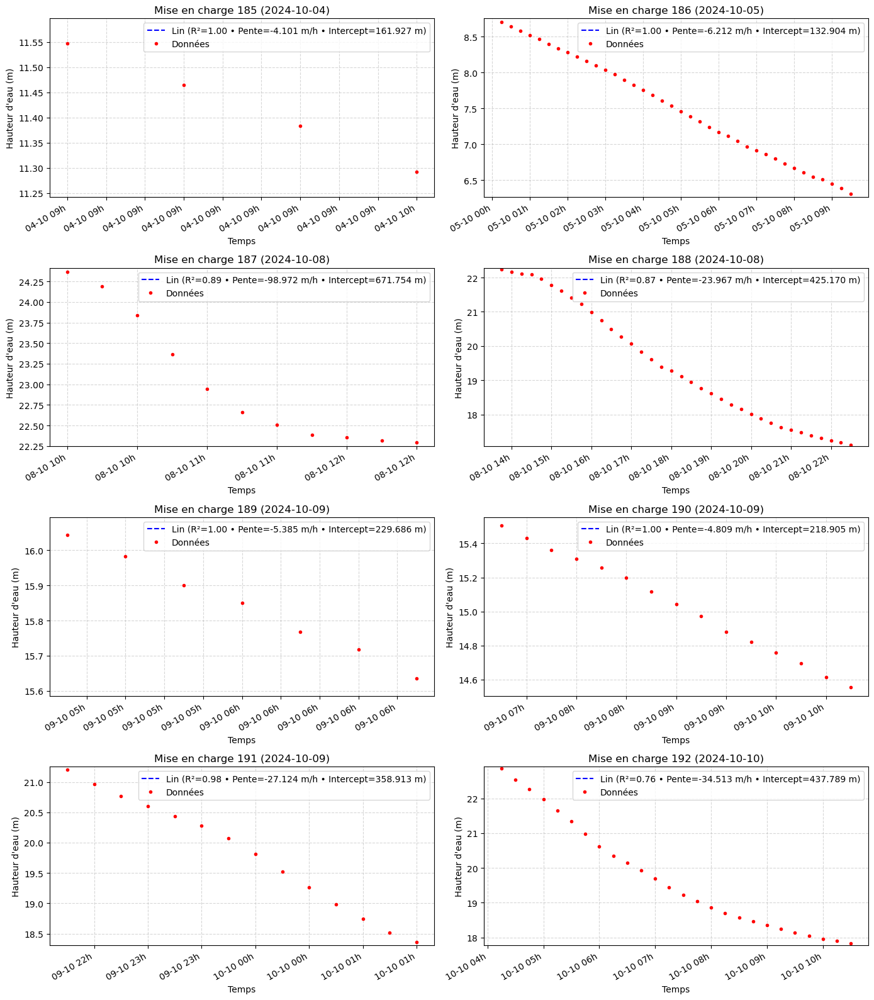

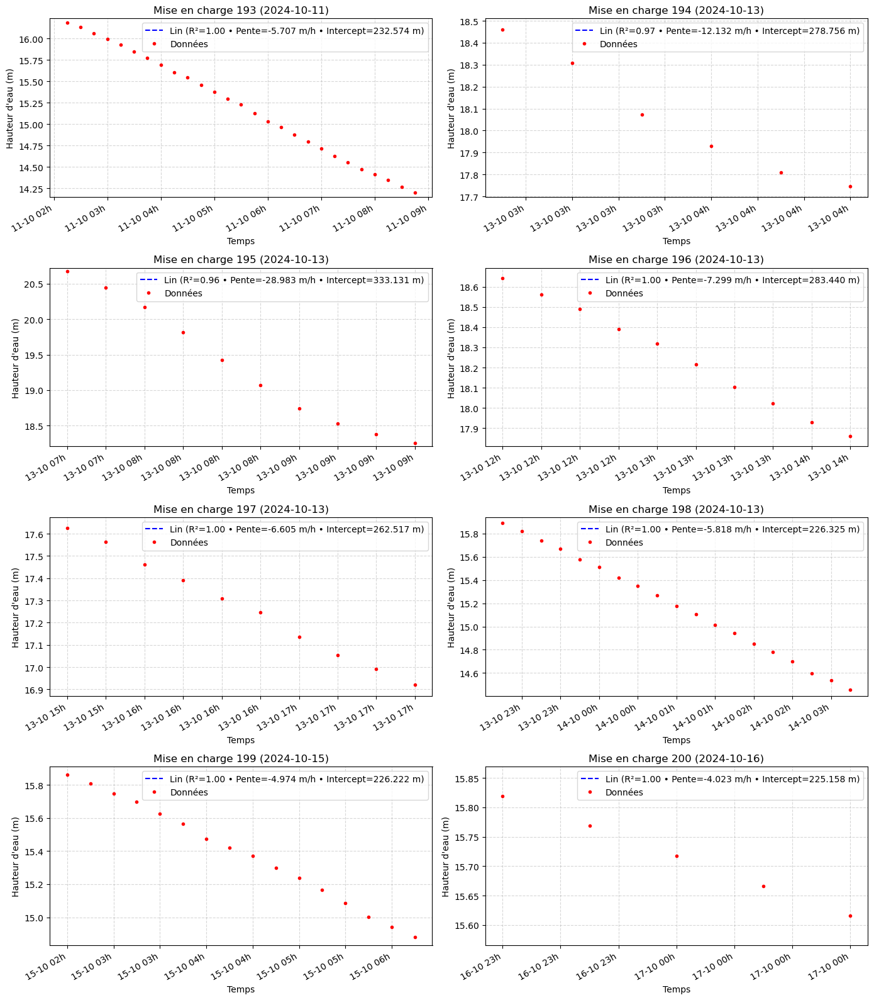

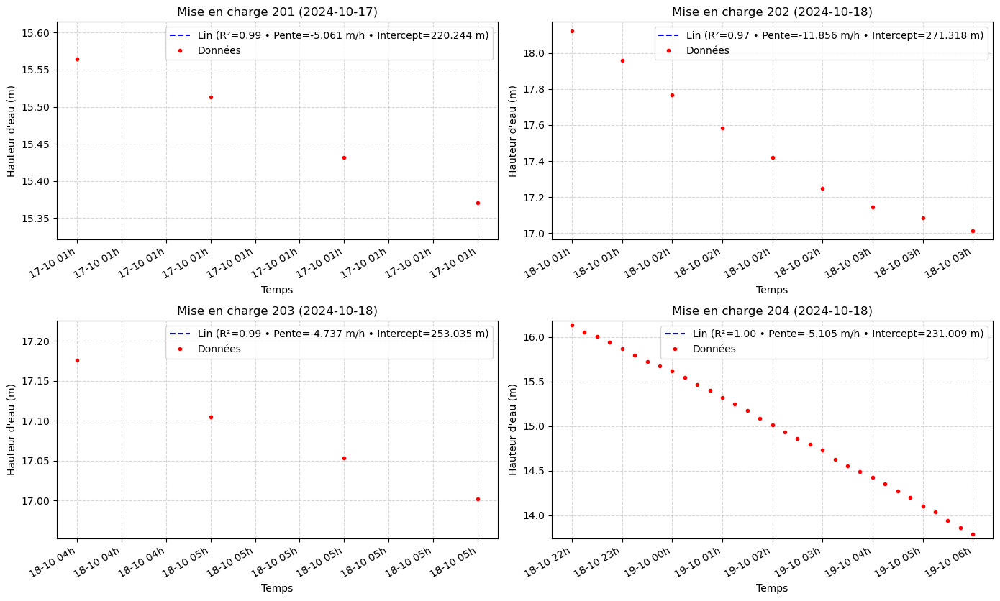

In [50]:

n = len(episodes_decharge)

if n == 0:
    print("Aucun épisode de charge trouvé.")
else:
    n_per_page = 8   # ⬅️ changer à 6 si tu veux 6 par page
    ncols = 2
    nrows = math.ceil(n_per_page / ncols)

    for page_start in range(0, n, n_per_page):
        page_end = min(page_start + n_per_page, n)
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 4 * nrows))
        axes = axes.flatten()

        for i, (idx, row) in enumerate(episodes_decharge.iloc[page_start:page_end].iterrows()):
            ax = axes[i]

            # Sous-dataframe
            sdf = df.loc[row["t_start"]:row["t_end"]]
            t = (sdf.index - sdf.index[0]).total_seconds() / 3600.0
            h = sdf["Hauteur_eau_siphon"].values

            # Fit exponentiel
            tau_exp = row.get("tau_h", np.nan)
            h_inf_exp = row.get("h_inf_estime", np.nan)
            if not np.isnan(tau_exp):
                h_model_exp = h_inf_exp + (h[0] - h_inf_exp) * np.exp(-t / tau_exp)
                ax.plot(sdf.index, h_model_exp, "--", color="black",
                        label=f"Exp (τ={tau_exp:.1f} h, R²={row.get('R2', np.nan):.2f})")

            # Fit linéaire
            slope = row.get("slope", np.nan)
            intercept = row.get("intercept", np.nan)
            r2_lin = row.get("R2_lin", np.nan)
            if not np.isnan(slope) and not np.isnan(intercept):
                h_model_lin = slope * t + intercept
                ax.plot(sdf.index, h_model_lin, "--", color="blue",
                        label=f"Lin (R²={r2_lin:.2f} • Pente={slope:.3f} m/h • Intercept={intercept:.3f} m)")

            # Données réelles
            ax.plot(sdf.index, h, "o", ms=3, color="red", label="Données")

            # Mise en forme
            ax.set_title(f"Mise en charge {page_start+i+1} ({row['t_start'].strftime('%Y-%m-%d')})")
            ax.set_xlabel("Temps")
            ax.set_ylabel("Hauteur d'eau (m)")
            ax.grid(True, linestyle="--", alpha=0.5)
            ax.legend()
            ax.set_ylim(h.min() - 0.05, h.max() + 0.05)

            ax.xaxis.set_major_formatter(mdates.DateFormatter("%d-%m %Hh"))  # Format jour-heure
            ax.xaxis.set_major_locator(mdates.AutoDateLocator())             # Placement auto
            plt.setp(ax.get_xticklabels(), rotation=30, ha="right")          # Rotation 30° lisible


        # Supprimer axes vides
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()
        # plt.savefig(f"mises_en_charge_page_{page_start//n_per_page+1}.pdf")  # ⬅️ si tu veux sauvegarder
